In [1]:
import tensorflow as tf
from tensorflow.python.framework import ops as ops
import tensorflow.contrib.eager as tfe
tf.enable_eager_execution()
import datetime
import os
import time
import numpy as np
import matplotlib.pyplot as plt
import PIL
from IPython.display import clear_output
import subprocess
import cv2
from scipy.stats import wasserstein_distance 
import csv

In [2]:
BUFFER_SIZE=10
IMG_SIZE=512
IMG_LOAD_SIZE=1500
CHANNELS=3
OUTPUT_CHANNELS = CHANNELS
BATCH_SIZE = 1
EPOCHS=300
LAMBDA=100
MISS_IMG_SIZE=201

In [3]:
def load_image2(image_file1, image_file2):
  print ('image is %s' % image_file1)
  image = tf.read_file(image_file1)
  image = tf.image.decode_png(image, channels=CHANNELS, dtype=tf.uint8)
  image1 = tf.image.resize_images(image, [1500, 1500])
  print ('image is %s' % image_file2)
  image = tf.read_file(image_file2)
  image = tf.image.decode_png(image, channels=CHANNELS, dtype=tf.uint8)
  image2 = tf.image.resize_images(image, [1500, 1500], method=1)
  return image1, image2

In [4]:
PATH = '/home/hh/Downloads/p2p_pics/'
in_imagepaths, tar_imagepaths=list(), list()
for _,_,files in os.walk(PATH+'train/input'):
    for name in files:
      in_imagepaths.append(os.path.join(PATH,'train/target',name))
      print('current image is: %s' % PATH+'train/target'+name)
      tar_imagepaths.append(os.path.join(PATH,'train/input',name))
      print('current image is: %s' % PATH+'train/input'+name)
train_dataset_in = tf.data.Dataset.list_files(in_imagepaths, shuffle=False)
train_dataset_tar = tf.data.Dataset.list_files(tar_imagepaths, shuffle=False)
train_dataset = tf.data.Dataset.zip((train_dataset_in, train_dataset_tar))
train_dataset = train_dataset.map(lambda x, y: load_image2(x, y))
train_dataset = train_dataset.batch(BATCH_SIZE)

PATH = '/home/hh/Downloads/p2p_pics/'
i_imagepaths, t_imagepaths=list(), list()
for _,_,testfiles in os.walk(PATH+'test/target'):
    for name in testfiles:
      i_imagepaths.append(os.path.join(PATH,'test/target',name))
      print('current image is: %s' % PATH+'test/target'+name)
      t_imagepaths.append(os.path.join(PATH,'test/input',name))
      print('current image is: %s' % PATH+'test/input'+name)
test_dataset_in = tf.data.Dataset.list_files(i_imagepaths, shuffle=False)
test_dataset_tar = tf.data.Dataset.list_files(t_imagepaths, shuffle=False)
test_dataset = tf.data.Dataset.zip((test_dataset_in, test_dataset_tar))
test_dataset = test_dataset.map(lambda x, y: load_image2(x, y))
test_dataset = test_dataset.batch(BATCH_SIZE)

current image is: /home/hh/Downloads/p2p_pics/train/target1132-113-12.png
current image is: /home/hh/Downloads/p2p_pics/train/input1132-113-12.png
current image is: /home/hh/Downloads/p2p_pics/train/target1132-113-81.png
current image is: /home/hh/Downloads/p2p_pics/train/input1132-113-81.png
current image is: /home/hh/Downloads/p2p_pics/train/target1132-113-104.png
current image is: /home/hh/Downloads/p2p_pics/train/input1132-113-104.png
current image is: /home/hh/Downloads/p2p_pics/train/target1132-113-41.png
current image is: /home/hh/Downloads/p2p_pics/train/input1132-113-41.png
current image is: /home/hh/Downloads/p2p_pics/train/target1132-113-73.png
current image is: /home/hh/Downloads/p2p_pics/train/input1132-113-73.png
current image is: /home/hh/Downloads/p2p_pics/train/target1132-113-92.png
current image is: /home/hh/Downloads/p2p_pics/train/input1132-113-92.png
current image is: /home/hh/Downloads/p2p_pics/train/target1132-113-68.png
current image is: /home/hh/Downloads/p2p_p

In [5]:
def display_images(test_input, tar, label1='input1', label2='input2'):
  plt.figure(figsize=(15,15))
  display_list = [test_input[0], tar[0]]
  title = [label1, label2]
  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    image=tf.cast(display_list[i], tf.float32)
    image = (image / 127.5) - 1
    print(np.max(image))
    plt.imshow(image * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

def display_images_f(test_input, tar, label1='input1', label2='input2'):
  plt.figure(figsize=(15,15))
  display_list = [test_input[0], tar[0]]
  title = [label1, label2]
  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    image=display_list[i]
    print(np.max(image))
    plt.imshow(image * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [6]:
#for input_image, target in train_dataset:
#  display_images(input_image, target)

In [7]:
class Downsample(tf.keras.Model):   
  def __init__(self, filters, size, apply_batchnorm=True):
    super(Downsample, self).__init__()
    self.apply_batchnorm = apply_batchnorm
    initializer = tf.random_normal_initializer(0., 0.02)
    self.conv1 = tf.keras.layers.Conv2D(filters, (size, size), strides=2, padding='same', kernel_initializer=initializer, use_bias=False)
    if self.apply_batchnorm:
        self.batchnorm = tf.keras.layers.BatchNormalization()
  
  def call(self, x, training):
    x = self.conv1(x)
    if self.apply_batchnorm:
        x = self.batchnorm(x, training=training)
    x = tf.nn.leaky_relu(x)
    return x 


class Upsample(tf.keras.Model):
  def __init__(self, filters, size, apply_dropout=False):
    super(Upsample, self).__init__()
    self.apply_dropout = apply_dropout
    initializer = tf.random_normal_initializer(0., 0.02)

    self.up_conv = tf.keras.layers.Conv2DTranspose(filters, (size, size), strides=2, padding='same', kernel_initializer=initializer, use_bias=False)
    self.batchnorm = tf.keras.layers.BatchNormalization()
    if self.apply_dropout:
        self.dropout = tf.keras.layers.Dropout(0.5)

  def call(self, x1, x2, training):
    x = self.up_conv(x1)
    x = self.batchnorm(x, training=training)
    if self.apply_dropout:
        x = self.dropout(x, training=training)
    x = tf.nn.relu(x)
    x = tf.concat([x, x2], axis=-1)
    return x


class Generator(tf.keras.Model):
  def __init__(self):
    super(Generator, self).__init__()
    initializer = tf.random_normal_initializer(0., 0.02)
    
    self.down0 = Downsample(64, 4, apply_batchnorm=False)
    self.down1 = Downsample(64, 4, apply_batchnorm=False)
    self.down2 = Downsample(128, 4)
    self.down3 = Downsample(256, 4)
    self.down4 = Downsample(512, 4)
    self.down5 = Downsample(512, 4)
    self.down6 = Downsample(512, 4)
    self.down7 = Downsample(512, 4)
    self.down8 = Downsample(512, 4)
    self.up1 = Upsample(512, 4, apply_dropout=True)
    self.up2 = Upsample(512, 4, apply_dropout=True)
    self.up3 = Upsample(512, 4, apply_dropout=True)
    self.up4 = Upsample(512, 4)
    self.up5 = Upsample(256, 4)
    self.up6 = Upsample(128, 4)
    self.up7 = Upsample(64, 4)
    self.up8 = Upsample(64, 4)
    self.last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, (4, 4), strides=2, padding='same', kernel_initializer=initializer)
  
  @tf.contrib.eager.defun
  def call(self, x, training):
    #x = tf.image.resize_images(xx, [IMG_SIZE, IMG_SIZE], method=1)
    #display_image_f(x)
    x0 = self.down0(x, training=training) # (bs, 256, 256, 64)
    x1 = self.down1(x0, training=training) # (bs, 128, 128, 64)
    x2 = self.down2(x1, training=training) # (bs, 64, 64, 128)
    x3 = self.down3(x2, training=training) # (bs, 32, 32, 256)
    x4 = self.down4(x3, training=training) # (bs, 16, 16, 512)
    x5 = self.down5(x4, training=training) # (bs, 8, 8, 512)
    x6 = self.down6(x5, training=training) # (bs, 4, 4, 512)
    x7 = self.down7(x6, training=training) # (bs, 2, 2, 512)
    x8 = self.down8(x7, training=training) # (bs, 1, 1, 512)
    x9 = self.up1(x8, x7, training=training) # (bs, 2, 2, 1024)
    x10 = self.up2(x9, x6, training=training) # (bs, 4, 4, 1024)
    x11 = self.up3(x10, x5, training=training) # (bs, 8, 8, 1024)
    x12 = self.up4(x11, x4, training=training) # (bs, 16, 16, 1024)
    x13 = self.up5(x12, x3, training=training) # (bs, 32, 32, 512)
    x14 = self.up6(x13, x2, training=training) # (bs, 64, 64, 256)
    x15 = self.up7(x14, x1, training=training) # (bs, 128, 128, 128)
    x16 = self.up8(x15, x0, training=training) # (bs, 256, 256, 128)
    x17 = self.last(x16) # (bs, 512, 512, 3)
    x17 = tf.nn.tanh(x17)
    return x17

class DiscDownsample(tf.keras.Model):
    
  def __init__(self, filters, size, apply_batchnorm=True):
    super(DiscDownsample, self).__init__()
    self.apply_batchnorm = apply_batchnorm
    initializer = tf.random_normal_initializer(0., 0.02)

    self.conv1 = tf.keras.layers.Conv2D(filters, 
                                        (size, size), 
                                        strides=2, 
                                        padding='same',
                                        kernel_initializer=initializer,
                                        use_bias=False)
    if self.apply_batchnorm:
        self.batchnorm = tf.keras.layers.BatchNormalization()
  
  def call(self, x, training):
    x = self.conv1(x)
    if self.apply_batchnorm:
        x = self.batchnorm(x, training=training)
    x = tf.nn.leaky_relu(x)
    return x 

class Discriminator(tf.keras.Model):
    
  def __init__(self):
    super(Discriminator, self).__init__()
    initializer = tf.random_normal_initializer(0., 0.02)
    
    self.down0 = DiscDownsample(64, 4, False)
    self.down1 = DiscDownsample(64, 4, False)
    self.down2 = DiscDownsample(128, 4)
    self.down3 = DiscDownsample(256, 4)
    
    # we are zero padding here with 1 because we need our shape to 
    # go from (batch_size, 32, 32, 256) to (batch_size, 31, 31, 512)
    self.zero_pad1 = tf.keras.layers.ZeroPadding2D()
    self.conv = tf.keras.layers.Conv2D(512, 
                                       (4, 4), 
                                       strides=1, 
                                       kernel_initializer=initializer, 
                                       use_bias=False)
    self.batchnorm1 = tf.keras.layers.BatchNormalization()
    
    # shape change from (batch_size, 31, 31, 512) to (batch_size, 30, 30, 1)
    self.zero_pad2 = tf.keras.layers.ZeroPadding2D()
    self.last = tf.keras.layers.Conv2D(1, 
                                       (4, 4), 
                                       strides=1,
                                       kernel_initializer=initializer)
  
  @tf.contrib.eager.defun
  def call(self, inp, tar, training):
    # concatenating the input and the target
    x = tf.concat([inp, tar], axis=-1) # (bs, 512, 512, channels*2)
    x = self.down0(x, training=training) # (bs, 256, 256, 64)
    x = self.down1(x, training=training) # (bs, 128, 128, 64)
    x = self.down2(x, training=training) # (bs, 64, 64, 128)
    x = self.down3(x, training=training) # (bs, 32, 32, 256)

    x = self.zero_pad1(x) # (bs, 34, 34, 256)
    x = self.conv(x)      # (bs, 31, 31, 512)
    x = self.batchnorm1(x, training=training)
    x = tf.nn.leaky_relu(x)
    
    x = self.zero_pad2(x) # (bs, 33, 33, 512)
    # don't add a sigmoid activation here since
    # the loss function expects raw logits.
    x = self.last(x)      # (bs, 30, 30, 1)

    return x

generator = Generator()
discriminator = Discriminator()

In [8]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = tf.losses.sigmoid_cross_entropy(multi_class_labels = tf.ones_like(disc_real_output), 
                                              logits = disc_real_output)
  generated_loss = tf.losses.sigmoid_cross_entropy(multi_class_labels = tf.zeros_like(disc_generated_output), 
                                                   logits = disc_generated_output)
  total_disc_loss = real_loss + generated_loss
  return total_disc_loss

def generator_loss(disc_generated_output, gen_output, targett):
  target = tf.image.resize_images(targett,[IMG_SIZE, IMG_SIZE]) 
  gan_loss = tf.losses.sigmoid_cross_entropy(multi_class_labels = tf.ones_like(disc_generated_output),
                                             logits = disc_generated_output) 
  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
  total_gen_loss = gan_loss + (LAMBDA * l1_loss)
  return total_gen_loss


generator_optimizer = tf.train.AdamOptimizer(5e-4, beta1=0.5)
discriminator_optimizer = tf.train.AdamOptimizer(5e-4, beta1=0.5)

In [9]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [10]:
summary_writer = tf.contrib.summary.create_file_writer('./logs_p2p', flush_millis=10000)
summary_writer.set_as_default()
global_step = tf.train.get_or_create_global_step()
def log_loss(name, loss):
    with tf.contrib.summary.always_record_summaries():
        tf.contrib.summary.scalar(name, loss)

In [11]:
def load_image2_without_resize(image_file1, image_file2):
  print ('image is %s' % image_file1)
  image = tf.read_file(image_file1)
  image1 = tf.image.decode_png(image, channels=CHANNELS, dtype=tf.uint8)
  print ('image is %s' % image_file2)
  image = tf.read_file(image_file2)
  image2 = tf.image.decode_png(image, channels=CHANNELS, dtype=tf.uint8)
  return image1, image2

PATH = '/home/hh/Downloads/Fruit_dataset/anomalies/'
img, mask=list(), list()
for _,_,files in os.walk(PATH+'black_big/'):
    for name in files:
        img.append(os.path.join(PATH,'black_big/',name))
        print('object image is: %s' % PATH+'black_big/'+name)
        mask.append(os.path.join(PATH,'black_big_mask/',name))
        print('current image is: %s' % PATH+'black_big_mask/'+name)
obj_dataset = tf.data.Dataset.list_files(img, shuffle=False)
mask_dataset = tf.data.Dataset.list_files(mask, shuffle=False)
anomaly_dataset = tf.data.Dataset.zip((obj_dataset, mask_dataset))
anomaly_dataset = anomaly_dataset.map(lambda x, y: load_image2_without_resize(x, y))
anomaly_dataset = anomaly_dataset.shuffle(5)
anomaly_dataset = anomaly_dataset.batch(1)

def anomaly_injection(img):
    index = np.random.randint(BATCH_SIZE)
    for obj, mask in anomaly_dataset:
        img = tf.image.resize_images(img, [IMG_SIZE, IMG_SIZE])
        img = tf.cast(img, tf.float32)
        obj = tf.cast(obj, tf.float32)
        mask = tf.cast(mask, tf.float32)
        img = (tf.cast(img*mask,tf.float32)/127.5)-1
        img_obj = (tf.cast(img + obj,tf.float32)/255)-1
        mask = (mask/127.5)-1
        return img_obj, mask

object image is: /home/hh/Downloads/Fruit_dataset/anomalies/black_big/walnut1.jpg
current image is: /home/hh/Downloads/Fruit_dataset/anomalies/black_big_mask/walnut1.jpg
object image is: /home/hh/Downloads/Fruit_dataset/anomalies/black_big/date1.jpg
current image is: /home/hh/Downloads/Fruit_dataset/anomalies/black_big_mask/date1.jpg
object image is: /home/hh/Downloads/Fruit_dataset/anomalies/black_big/orange1.jpg
current image is: /home/hh/Downloads/Fruit_dataset/anomalies/black_big_mask/orange1.jpg
object image is: /home/hh/Downloads/Fruit_dataset/anomalies/black_big/apple1.jpg
current image is: /home/hh/Downloads/Fruit_dataset/anomalies/black_big_mask/apple1.jpg
object image is: /home/hh/Downloads/Fruit_dataset/anomalies/black_big/banana1.jpg
current image is: /home/hh/Downloads/Fruit_dataset/anomalies/black_big_mask/banana1.jpg
image is Tensor("arg0:0", shape=(), dtype=string)
image is Tensor("arg1:0", shape=(), dtype=string)


In [12]:
def anomaly_test(given_img, gen_img):
    lp = ((IMG_SIZE-MISS_IMG_SIZE)/2)/float(IMG_SIZE)
    hp = ((IMG_SIZE+MISS_IMG_SIZE)/2)/float(IMG_SIZE)
    roi_actual=tf.image.crop_and_resize(image=given_img,boxes=[[lp,lp,hp,hp]],crop_size=[MISS_IMG_SIZE,MISS_IMG_SIZE],box_ind=[0])
    roi_gen=tf.image.crop_and_resize(image=gen_img,boxes=[[lp,lp,hp,hp]],crop_size=[MISS_IMG_SIZE,MISS_IMG_SIZE], box_ind=[0])
    display_images_f(roi_actual, roi_gen, 'roi_actual', 'roi_gen')
    
    roi_actual_np = tf.cast(roi_actual, tf.float32).numpy()
    #print(roi_actual_np.shape)
    roi_gen_np = tf.cast(roi_gen, tf.float32).numpy()
    
    plt.subplot(1, 2, 1)
    plt.hist(roi_actual_np.flatten(), bins='auto')
    plt.title("Histogram actual")
    plt.subplot(1, 2, 2)
    plt.hist(roi_gen_np.flatten(), bins='auto')
    plt.title("Histogram generated")
    plt.show()
    hist_actual = np.histogram(roi_actual_np.flatten(), bins=200, range=[-1, 1])
    hist_gen = np.histogram(roi_gen_np.flatten(), bins=200, range=[-1, 1])
    wdist = wasserstein_distance(hist_actual[0], hist_gen[0])
    return wdist

In [13]:
label2class = {
    (255, 255, 255): 'Street',
    (0, 0, 255): 'Building',
    (0, 255, 255): 'Low_veg',
    (0, 255, 0): 'Trees',
    (255, 255, 0): 'Cars',
    (127, 127, 127): 'Unknown',
    (255, 0, 0): 'Unknown', # Water
    (255, 20, 147): 'Unknown',  # Humans
    (79, 42, 0): 'Unknown',  # Masts
    (151, 0, 206): 'Unknown'  # Wires
}

def display_any_num_images(images, titles):
    display_list = []
    for image in images:
        image = tf.cast(image[0], tf.float32)
        image = (image / 127.5) - 1
        display_list.append(image)
    title_list = []
    for title in titles:
        title = tf.cast(title[0], tf.float32)
        title = (title / 127.5) - 1
        title_list.append(title[0])
    display_any_num_images_f(display_list, title_list)

def display_any_num_images_f(images, titles):
    plt.figure(figsize=(15,15))
    #make lists
    display_list = []
    for image in images:
        display_list.append(image[0])
    title_list = []
    for title in titles:
        title_list.append(title)
    for i in range(len(images)):
        plt.subplot(1, len(images), i+1)
        plt.title(title_list[i])
        image=display_list[i]
        #images are between -1 and 1
        plt.imshow(image * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

def display_hists(nps, titles, num_class, ind):
    lv = len(nps)
    for i in range(len(nps)):
        plt.subplot(lv, num_class, ind+10*i+1)
        plt.title(titles[i])
        plt.hist(nps[i].flatten(), bins='auto')

def display_hists_show(nps, titles):
    for i in range(len(nps)):
        plt.subplot(1,len(nps),i+1)
        plt.title(titles[i])
        plt.hist(nps[i].flatten(), bins='auto')
    plt.show()
    
class_loss_actual_gen_roi = {}
class_loss_gen_roi_actual_neigh = {}
class_loss_anomaly_gen_roi = {}

def anomaly_test_boundary(actual_img, anomaly_img, gen_img, input_intact):
    #making the central crop
    lp = ((IMG_SIZE-MISS_IMG_SIZE)/2)/float(IMG_SIZE)
    hp = ((IMG_SIZE+MISS_IMG_SIZE)/2)/float(IMG_SIZE)
    roi_actual=tf.image.crop_and_resize(image=actual_img,boxes=[[lp,lp,hp,hp]],crop_size=[MISS_IMG_SIZE,MISS_IMG_SIZE],box_ind=[0])
    roi_anomaly=tf.image.crop_and_resize(image=anomaly_img,boxes=[[lp,lp,hp,hp]],crop_size=[MISS_IMG_SIZE,MISS_IMG_SIZE],box_ind=[0])
    roi_gen=tf.image.crop_and_resize(image=gen_img,boxes=[[lp,lp,hp,hp]],crop_size=[MISS_IMG_SIZE,MISS_IMG_SIZE], box_ind=[0])
    roi_label=tf.image.crop_and_resize(image=input_intact,boxes=[[lp,lp,hp,hp]],crop_size=[MISS_IMG_SIZE,MISS_IMG_SIZE],box_ind=[0], method='nearest')
    display_any_num_images_f([roi_actual, roi_anomaly, roi_gen, roi_label], ["roi_actual", "roi_anomaly", "roi_gen", "roi_label"])
    #all nps
    roi_actual_np = tf.cast(roi_actual, tf.float32).numpy()
    roi_anomaly_np = tf.cast(roi_anomaly, tf.float32).numpy()
    roi_gen_np = tf.cast(roi_gen, tf.float32).numpy()
    roi_label_np=tf.cast(roi_label, tf.float32).numpy()
    
    #GENERATOR CHECK--FOR GENERAL PERFORMANCE
    #for the labels which are in roi_label_np
        #check that distribution of each class in roi_label_np ( hist(roi_actual_np) )is close to ( hist(roi_gen_np) )
    #ANOMALY CHECK--
    #for the labels which are in roi_label_np
        #check that distribution of each class in roi_label_np ( hist(roi_gen_np) )  is close to ( hist(roi_anomaly_np) )
        #why per class, if you do it for all classes together then if 2 classes have very different colors that would include a large color spectrum
        #and hence anomaly detection would be tough to find.
    cl_in_roi = (roi_label_np.reshape([-1, 3])).astype(int)
    classes_in_roi = np.unique(cl_in_roi, axis=0)
    #print(classes_in_roi)
    lindex=0
    for label, obj in label2class.items():
        found=False
        rl, gl, bl = np.array(classes_in_roi).T
        for iii in range(rl.size):
            found = ((rl[iii]==label[0]) & (gl[iii]==label[1]) & (bl[iii]==label[2]))
            #print(rl[iii]==label[0])
            #print(gl[iii]==label[1])
            #print(bl[iii]==label[2])
            #print("found {}".format(found))
            if found:
                print("found {} at {}".format(obj, iii))
                break
        if found:
            print('current label {} and class {}'.format(list(label), obj))
            #make copies
            roi_actual_copy_m = np.zeros(roi_actual_np.shape)
            roi_gen_copy_m = np.zeros(roi_gen_np.shape)
            roi_anomaly_copy_m = np.zeros(roi_anomaly_np.shape)
            rr,gg,bb = roi_label_np.T
            color_area = ((rr==label[0]) & (gg==label[1]) & (bb==label[2]))
            roi_actual_copy_m[..., :][color_area.T] = (1,1,1)
            roi_gen_copy_m[..., :][color_area.T] = (1,1,1)
            roi_anomaly_copy_m[..., :][color_area.T] = (1,1,1)
            roi_actual_copy = roi_actual_copy_m * roi_actual_np
            roi_gen_copy = roi_gen_copy_m * roi_gen_np
            roi_anomaly_copy = roi_anomaly_copy_m * roi_anomaly_np
            
            hist_actual = np.histogram(roi_actual_copy.flatten(), bins=200, range=[-1, 1])
            hist_gen = np.histogram(roi_gen_copy.flatten(), bins=200, range=[-1, 1])
            hist_anomaly = np.histogram(roi_anomaly_copy.flatten(), bins=200, range=[-1, 1])
            class_loss_actual_gen_roi[obj] = wasserstein_distance(hist_actual[0], hist_gen[0])
            class_loss_anomaly_gen_roi[obj] = wasserstein_distance(hist_anomaly[0], hist_gen[0])
            print('dist b/w actual and gen roi: {} for class: {}'.format(wasserstein_distance(hist_actual[0], hist_gen[0]), obj))
            print('dist b/w anomaly and gen roi: {} for class: {}'.format(wasserstein_distance(hist_anomaly[0], hist_gen[0]), obj))
            #display class histograms
            display_hists([roi_actual_copy,roi_anomaly_copy,roi_gen_copy], ['actual{}'.format(obj),'anomaly{}'.format(obj),'gen{}'.format(obj)], len(label2class), lindex)
            lindex=lindex+1
        else:
            print("ALiasing error in image, CHECK.")
    plt.show()
    with open('generator_general_check.csv', mode='a') as ggc_file:
        ggc_writer = csv.writer(ggc_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
        ggc_writer.writerow(class_loss_actual_gen_roi.values())
    with open('generator_anomaly_check.csv', mode='a') as gac_file:
        gac_writer = csv.writer(gac_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
        gac_writer.writerow(class_loss_anomaly_gen_roi.values())
    
    #neighbourhood processing
    #get a bigger central crop
    WIND_SIZE=200
    lpw = ((IMG_SIZE-MISS_IMG_SIZE-WIND_SIZE)/2)/float(IMG_SIZE)
    hpw = ((IMG_SIZE+MISS_IMG_SIZE+WIND_SIZE)/2)/float(IMG_SIZE)
    roi_neigh_actual=tf.image.crop_and_resize(image=actual_img,boxes=[[lpw,lpw,hpw,hpw]],crop_size=[MISS_IMG_SIZE+WIND_SIZE,MISS_IMG_SIZE+WIND_SIZE],box_ind=[0])
    roi_neigh_label=tf.image.crop_and_resize(image=input_intact,boxes=[[lpw,lpw,hpw,hpw]],crop_size=[MISS_IMG_SIZE+WIND_SIZE,MISS_IMG_SIZE+WIND_SIZE],box_ind=[0], method='nearest')
    roi_neigh_actual_np=tf.cast(roi_neigh_actual, tf.float32).numpy()
    roi_neigh_label_np=tf.cast(roi_neigh_label, tf.float32).numpy()
    display_any_num_images_f([roi_neigh_actual, roi_neigh_label], ['roi_big_actual', 'roi_big_label'])    
    #pad the smaller central crop with 0s to make equal to the big central block
    np_neigh_mask = np.ones((1,401,401,3))
    np_neigh_mask[0, 100:301, 100:301, :] = 0
    #display_any_num_images_f([np_neigh_mask], ['mask'])
    
    #print('roi_actual_np shape: {}'.format(roi_actual_np.shape))
    #print('roi_label_np shape: {}'.format(roi_label_np.shape))
    #print('np_neigh_mask shape: {}'.format(np_neigh_mask.shape))
    
    #converting to PIL image to display finally
    roi_neigh_np_imagery = roi_neigh_actual_np*np_neigh_mask
    roi_neigh_np_labels = roi_neigh_label_np*np_neigh_mask
    roi_neigh_np_imagery_t = tf.convert_to_tensor(roi_neigh_np_imagery, dtype=tf.float32)
    roi_neigh_np_labels_t = tf.convert_to_tensor(roi_neigh_np_labels, dtype=tf.float32)
    display_any_num_images_f([roi_neigh_np_imagery_t, roi_neigh_np_labels_t], ['neigh_actual', 'neigh_label'])
    
    #use a list of unique labels in roi_label_np---class_inside_roi
    #make a list of unique labels in roi_window_np_mask_label---class_in_neigh
    #for unique labels in roi_label_np that are in roi_window_np_mask_label, compare histograms
    classes_in_neigh = np.unique((roi_neigh_np_labels.reshape([-1, 3])).astype(int), axis=0)
    #GENERATOR CHECK--FOR FOCUS ON CONSISTENCY
    #for the labels which are in roi_window_np_mask_label & roi_label_np
        #check that distribution of each class in roi_window_np_mask_label ( hist(roi_window_np_mask_actual) )is close to ( hist(roi_gen_np) )
    lindex=0
    for label, obj in label2class.items():
        found=False
        rl, gl, bl = np.array(classes_in_roi).T
        for iii in range(rl.size):
            found = ((rl[iii]==label[0]) & (gl[iii]==label[1]) & (bl[iii]==label[2]))
            if found==True:
                print("found {} at {}".format(obj, iii))
                break
        if found:
            roi_neigh_copy_m = np.zeros(roi_neigh_np_imagery.shape)
            roi_gen_copy_m = np.zeros(roi_gen_np.shape)
            rr,gg,bb = roi_label_np.T
            rn,gn,bn = roi_neigh_np_labels.T
            color_area = ((rr==label[0]) & (gg==label[1]) & (bb==label[2]))
            color_arean = ((rn==label[0]) & (gn==label[1]) & (bn==label[2]))
            roi_neigh_copy_m[..., :][color_arean.T] = (1,1,1)
            roi_gen_copy_m[..., :][color_area.T] = (1,1,1)
            roi_neigh_copy = roi_neigh_copy_m * roi_neigh_np_imagery
            roi_gen_copy = roi_gen_copy_m * roi_gen_np
            hist_neigh = np.histogram(roi_neigh_copy.flatten(), bins=200, range=[-1, 1])
            hist_gen = np.histogram(roi_gen_copy.flatten(), bins=200, range=[-1, 1])
            class_loss_gen_roi_actual_neigh[obj] = wasserstein_distance(hist_neigh[0], hist_gen[0])
            print('dist b/w neigh and gen roi: {} for class: {}'.format(wasserstein_distance(hist_neigh[0], hist_gen[0]), obj))
            #display class histograms
            display_hists([roi_neigh_copy,roi_gen_copy], ["neigh"+obj,"gen"+obj], len(label2class), lindex)
            lindex=lindex+1
        else:
            print("Either class not in ROI or Aliasing error in image, CHECK.")
    plt.show()
    with open('generator_consistency_check.csv', mode='a') as gcc_file:
        gcc_writer = csv.writer(gcc_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
        gcc_writer.writerow(class_loss_gen_roi_actual_neigh.values())
        
    roi_actual_np = roi_actual_np
    #print(np.min(roi_actual_np))
    #print(np.max(roi_actual_np))
    hist_actual = np.histogram(roi_actual_np.flatten(), bins=200, range=[-1, 1])
    roi_gen_np = roi_gen_np
    #print(np.min(roi_actual_np))
    #print(np.max(roi_actual_np))
    hist_gen = np.histogram(roi_gen_np.flatten(), bins=200, range=[-1, 1])
    roi_anomaly_np = roi_anomaly_np
    #print(np.min(roi_anomaly_np))
    #print(np.max(roi_actual_np))
    hist_anomaly = np.histogram(roi_anomaly_np.flatten(), bins=200, range=[-1, 1])
    roi_neigh_np_imagery = roi_neigh_np_imagery
    #print(np.min(roi_neigh_np_imagery))
    #print(np.max(roi_actual_np))
    hist_neigh = np.histogram(roi_neigh_np_imagery.flatten(), bins=200, range=[-1, 1])
    display_hists_show([roi_actual_np, roi_neigh_np_imagery, roi_anomaly_np, roi_gen_np], ["actual", "neigh", "anomaly", "gen"])
    plt.show()

In [14]:
def generate_images(model, test_input, tar, test_input_an, input_intact):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15,15))

    display_list = [test_input[0], tar[0], prediction[0], test_input_an[0], input_intact[0]]
    title = ['Input', 'Ground Truth', 'Predicted', 'Anomaly', 'Labels']

    print('Dist between generated images {}'.format(anomaly_test(tar, prediction)))
    print('Dist between ANOMALY images {}'.format(anomaly_test(test_input_an, prediction)))
    anomaly_test_boundary(tar, test_input_an, prediction, input_intact)

    for i in range(5):
        plt.subplot(1, 5, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

In [15]:
def train(dataset, epochs): 
  with open('generator_general_check.csv', mode='a') as ggc_file:
      ggc_writer = csv.writer(ggc_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
  with open('generator_consistency_check.csv', mode='a') as gcc_file:
      gcc_writer = csv.writer(gcc_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
  with open('generator_anomaly_check.csv', mode='a') as gac_file:
      gac_writer = csv.writer(gac_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
  for epoch in range(epochs):
    start = time.time()

    for input_image, target in dataset:
      global_step.assign_add(1)

      with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        #taking random x ad y
        px,py = np.random.randint(0, 988, size=2)
        #2. making random_crops
        inp_r = tf.image.crop_and_resize(image=input_image, boxes=[[py/1500.0, px/1500.0, (py+IMG_SIZE)/1500.0, (px+IMG_SIZE)/1500.0]], crop_size=[IMG_SIZE, IMG_SIZE], box_ind=[0], method='nearest')
        tar_r = tf.image.crop_and_resize(image=target, boxes=[[py/1500.0, px/1500.0, (py+IMG_SIZE)/1500.0, (px+IMG_SIZE)/1500.0]], crop_size=[IMG_SIZE, IMG_SIZE], box_ind=[0])
        #3. changing brightness & contrast
        tar_r = tf.image.random_brightness(tar_r, max_delta=63)
        tar_r = tf.image.random_contrast(tar_r, lower=0.2, upper=1.8)
        #5. randomly flipping it (can have similar for top_bottom) CAREFULL..!
        if np.random.random() > 0.5:
          inp_r = tf.image.flip_left_right(inp_r)
          tar_r = tf.image.flip_left_right(tar_r)
        #display_images(inp_r, tar_r)
        inp_r = tf.image.resize_images(inp_r, [IMG_SIZE, IMG_SIZE], method=1)
        tar_r = tf.image.resize_images(tar_r, [IMG_SIZE, IMG_SIZE])
        
        image_mask = np.ones((IMG_SIZE,IMG_SIZE,3))
        image_mask[int(IMG_SIZE/2-MISS_IMG_SIZE/2):int(IMG_SIZE/2+MISS_IMG_SIZE/2+1), int(IMG_SIZE/2-MISS_IMG_SIZE/2):int(IMG_SIZE/2+MISS_IMG_SIZE/2+1), :] = 0
        image_mask_t = tf.convert_to_tensor(image_mask, dtype=tf.float32)
        image_inp = tf.multiply(tar_r, image_mask_t)
        image_mask = np.ones((IMG_SIZE,IMG_SIZE,3)) - image_mask
        image_mask_t = tf.convert_to_tensor(image_mask, dtype=tf.float32)
        image_inp = tf.add(image_inp, tf.multiply(inp_r, image_mask_t))
        
        inp_g = tf.cast(image_inp, tf.float32)
        input_image_g = (inp_g / 127.5) - 1
        inp = tf.cast(inp_r, tf.float32)
        input_image = (inp / 127.5) - 1
        tar = tf.cast(tar_r, tf.float32)
        target = (tar / 127.5) - 1
        #display_images_f(input_image, target)
        
        gen_output = generator(input_image_g, training=True)
        disc_real_output = discriminator(input_image, target, training=True)
        disc_generated_output = discriminator(input_image, gen_output, training=True)
        
        gen_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
        log_loss('gen_loss', gen_loss)
        log_loss('disc_loss', disc_loss)
        
      generator_gradients = gen_tape.gradient(gen_loss, 
                                              generator.variables)
      discriminator_gradients = disc_tape.gradient(disc_loss, 
                                                   discriminator.variables)

      generator_optimizer.apply_gradients(zip(generator_gradients, 
                                              generator.variables))
      discriminator_optimizer.apply_gradients(zip(discriminator_gradients, 
                                                  discriminator.variables))

    if epoch % 1 == 0:
        #clear_output(wait=True)
        for inp, tar in test_dataset.take(1):
            inp = tf.image.resize_images(inp, [IMG_SIZE, IMG_SIZE], method=1)
            inp_intact = inp
            tar = tf.image.resize_images(tar, [IMG_SIZE, IMG_SIZE])
            inp_an, mask_an = anomaly_injection(tar)
            image_mask = np.ones((IMG_SIZE,IMG_SIZE,3))
            image_mask[int(IMG_SIZE/2-MISS_IMG_SIZE/2):int(IMG_SIZE/2+MISS_IMG_SIZE/2+1), int(IMG_SIZE/2-MISS_IMG_SIZE/2):int(IMG_SIZE/2+MISS_IMG_SIZE/2+1), :] = 0
            image_mask_t = tf.convert_to_tensor(image_mask, dtype=tf.float32)
            image_inp = tf.multiply(tar, image_mask_t)
            image_mask = np.ones((IMG_SIZE,IMG_SIZE,3)) - image_mask
            image_mask_t = tf.convert_to_tensor(image_mask, dtype=tf.float32)
            image_inp = tf.add(image_inp, tf.multiply(inp, image_mask_t))
            inp=tf.cast(image_inp, tf.float32)
            inp = (inp / 127.5) - 1
            tar=tf.cast(tar, tf.float32)
            tar = (tar / 127.5) - 1
            generate_images(generator, inp, tar, inp_an, inp_intact)
            
    # saving (checkpoint) the model every 20 epochs
    if (epoch + 1) % 20 == 0:
        checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  tf.contrib.summary.flush()  

In [ ]:
train(train_dataset, EPOCHS)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


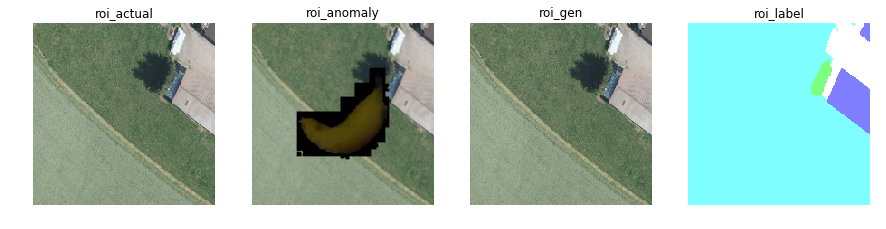

[[  0   0 255]
 [  0  84 255]
 [  0 169 255]
 [  0 255   0]
 [  0 255  84]
 [  0 255 169]
 [  0 255 170]
 [  0 255 255]
 [ 42  42 212]
 [ 42 212 212]
 [ 84  84 255]
 [ 84 169  84]
 [ 84 169 169]
 [ 85  85 255]
 [127 127 127]
 [169 169 169]
 [169 255 255]
 [170 255 170]
 [170 255 255]
 [212 212 212]
 [255 255 255]]
found Street at 20
current label [255, 255, 255] and class Street
dist b/w actual and gen roi: 0.0 for class: Street
dist b/w anomaly and gen roi: 1.5999999999999999 for class: Street
found Building at 0
current label [0, 0, 255] and class Building
dist b/w actual and gen roi: 0.0 for class: Building
dist b/w anomaly and gen roi: 2.5 for class: Building
found Low_veg at 7
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 109.445 for class: Low_veg
found Trees at 3
current label [0, 255, 0] and class Trees
dist b/w actual and gen roi: 0.0 for class: Trees
dist b/w anomaly and gen roi: 1.775 for class

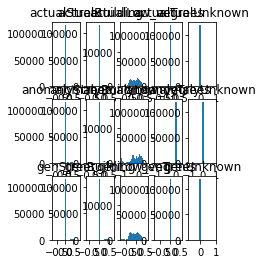

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


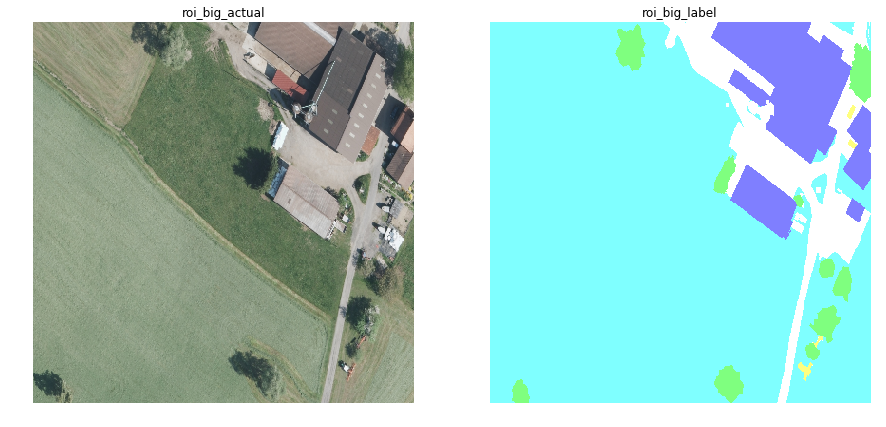

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


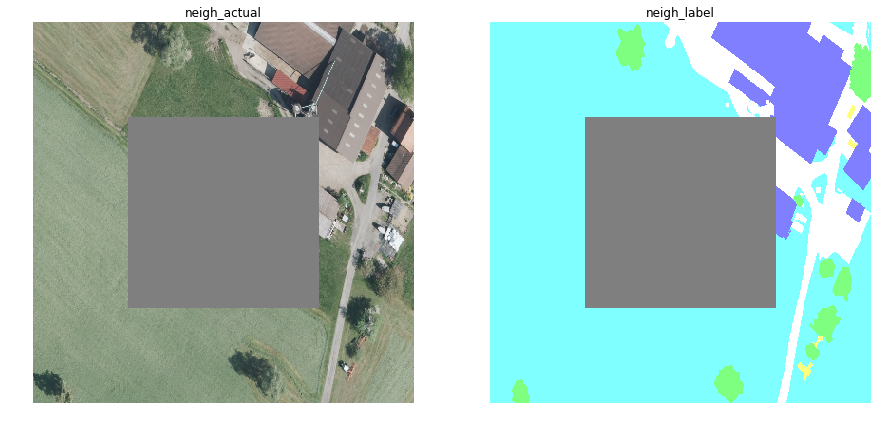

found Street at 20
dist b/w neigh and gen roi: 1806.0000000000014 for class: Street
found Building at 0
dist b/w neigh and gen roi: 1806.0000000000014 for class: Building
found Low_veg at 7
dist b/w neigh and gen roi: 1806.000000000001 for class: Low_veg
found Trees at 3
dist b/w neigh and gen roi: 1806.0000000000016 for class: Trees
ALiasing error in image, CHECK.
found Unknown at 14
dist b/w neigh and gen roi: 1807.0400000000018 for class: Unknown
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


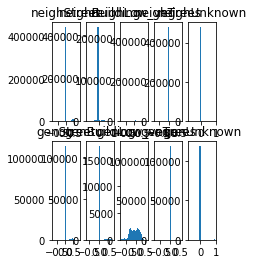

-0.756636
0.94509804
-0.756636
0.94509804
-1.0039216
0.94509804
-0.775023341178894
0.94509804


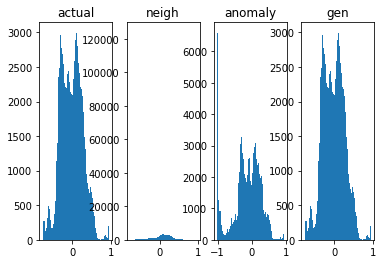

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


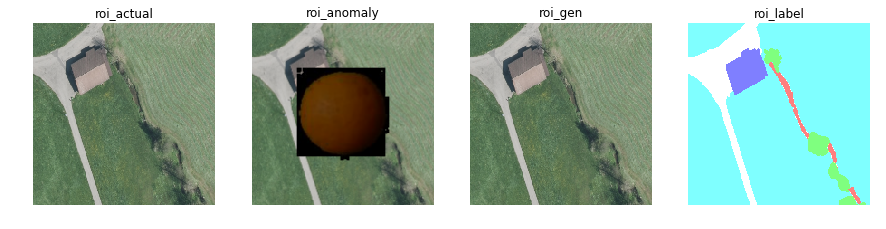

[[  0   0 255]
 [  0  84 255]
 [  0  85 255]
 [  0 170 255]
 [  0 255   0]
 [  0 255  84]
 [  0 255  85]
 [  0 255 169]
 [  0 255 170]
 [  0 255 255]
 [ 84  84 255]
 [ 84 170 170]
 [ 84 255 255]
 [ 85  85 255]
 [ 85 169   0]
 [ 85 169 169]
 [ 85 255 255]
 [169  85   0]
 [169  85  85]
 [169 255 255]
 [170  84   0]
 [170  84  84]
 [170 255 255]
 [255   0   0]
 [255 255 255]]
found Street at 24
current label [255, 255, 255] and class Street
dist b/w actual and gen roi: 0.0 for class: Street
dist b/w anomaly and gen roi: 5.034999999999999 for class: Street
found Building at 0
current label [0, 0, 255] and class Building
dist b/w actual and gen roi: 0.0 for class: Building
dist b/w anomaly and gen roi: 10.485000000000003 for class: Building
found Low_veg at 9
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 127.28500000000001 for class: Low_veg
found Trees at 4
current label [0, 255, 0] and class Trees
dist b/w a

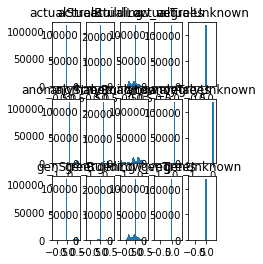

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


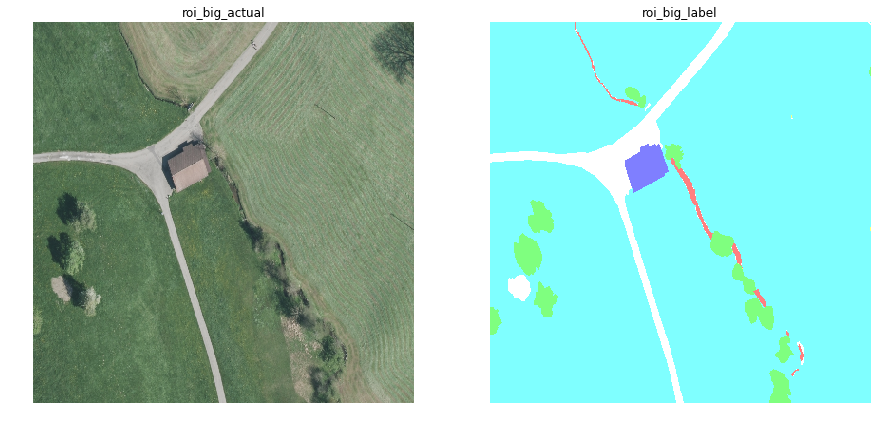

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


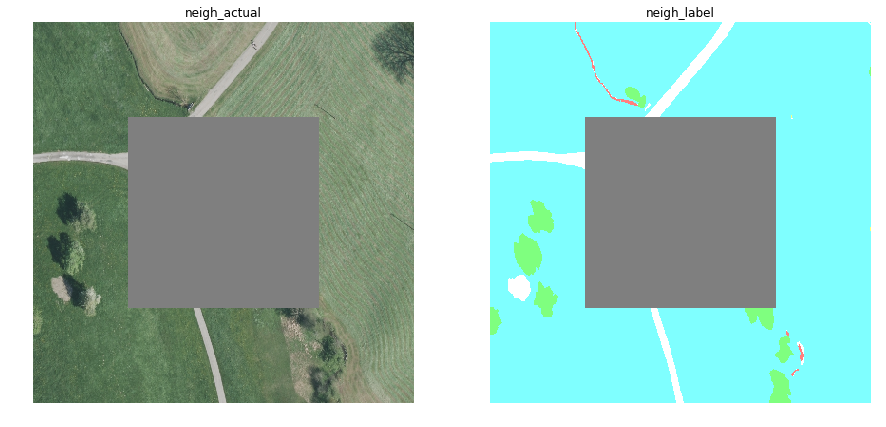

found Street at 24
dist b/w neigh and gen roi: 1817.8600000000015 for class: Street
found Building at 0
dist b/w neigh and gen roi: 1850.4800000000016 for class: Building
found Low_veg at 9
dist b/w neigh and gen roi: 1806.0000000000005 for class: Low_veg
found Trees at 4
dist b/w neigh and gen roi: 1806.0000000000014 for class: Trees
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Unknown at 23
dist b/w neigh and gen roi: 1816.4000000000017 for class: Unknown
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


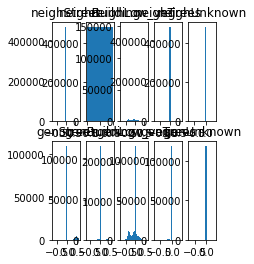

-0.733486
0.6061105
-0.733486
0.6061105
-1.0039216
0.6061105
-0.7568627595901489
0.6061105


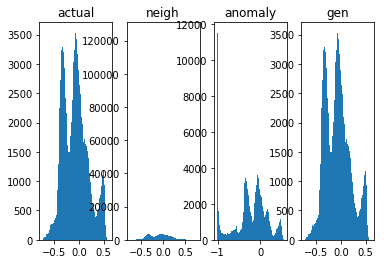

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


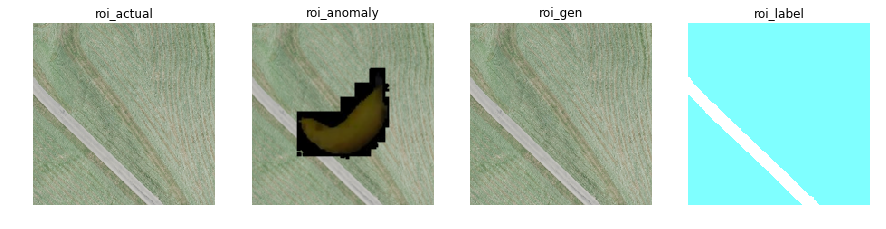

[[  0 255 255]
 [ 84 255 255]
 [ 85 255 255]
 [169 255 255]
 [170 255 255]
 [255 255 255]]
found Street at 5
current label [255, 255, 255] and class Street
dist b/w actual and gen roi: 0.0 for class: Street
dist b/w anomaly and gen roi: 10.049999999999999 for class: Street
ALiasing error in image, CHECK.
found Low_veg at 0
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 114.94500000000001 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


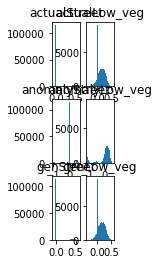

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


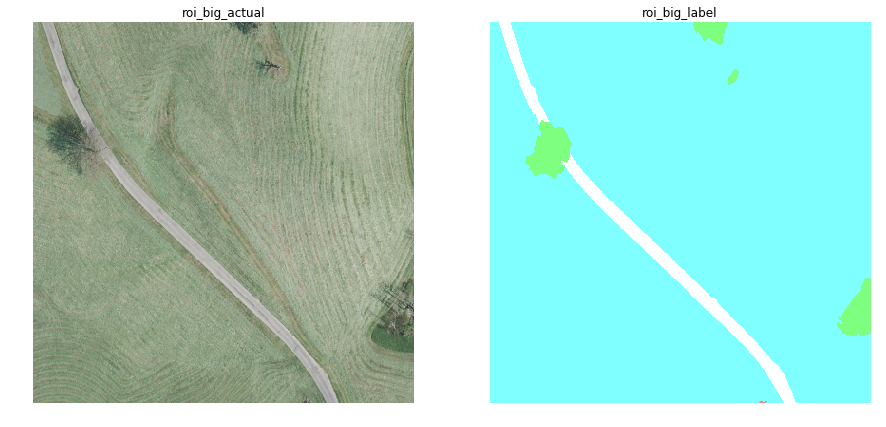

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


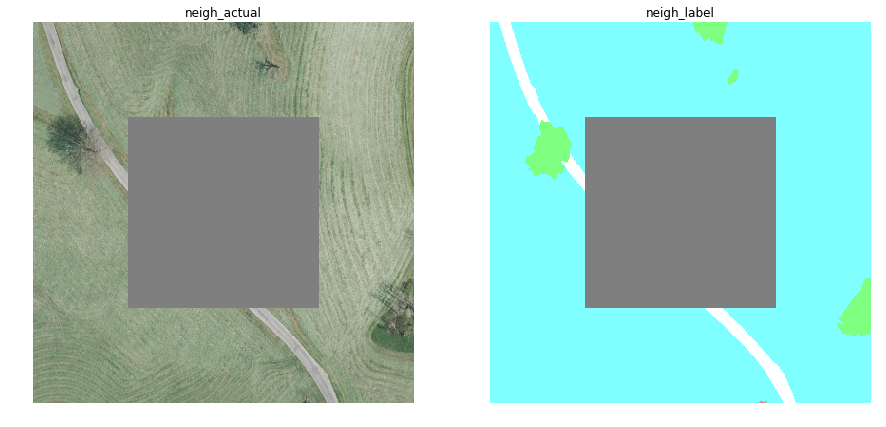

found Street at 5
dist b/w neigh and gen roi: 1806.0000000000016 for class: Street
ALiasing error in image, CHECK.
found Low_veg at 0
dist b/w neigh and gen roi: 1806.0000000000005 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


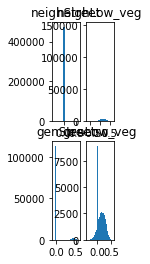

-0.3801413
0.5858449
-0.3801413
0.5858449
-1.0039216
0.5858449
-0.6782525777816772
0.5858449


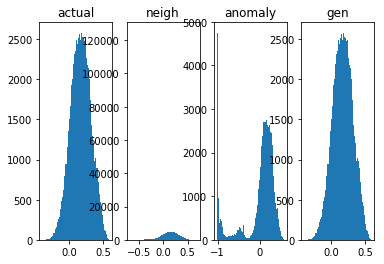

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


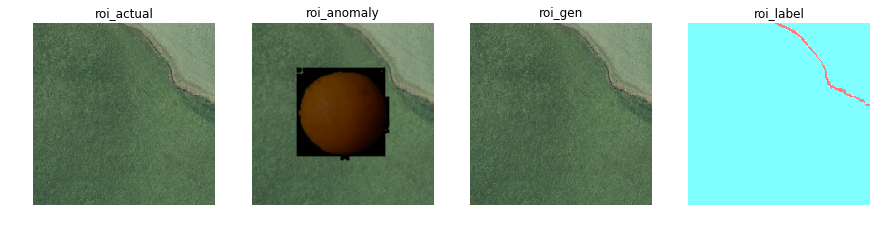

[[  0 255 255]
 [ 84 170 170]
 [ 85 169 169]
 [169  85  85]
 [170  84  84]
 [255   0   0]]
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 0
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 150.42499999999998 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Unknown at 5
current label [255, 0, 0] and class Unknown
dist b/w actual and gen roi: 0.0 for class: Unknown
dist b/w anomaly and gen roi: 0.9800000000000001 for class: Unknown
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


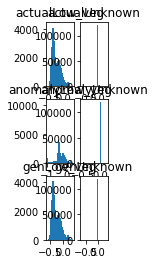

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


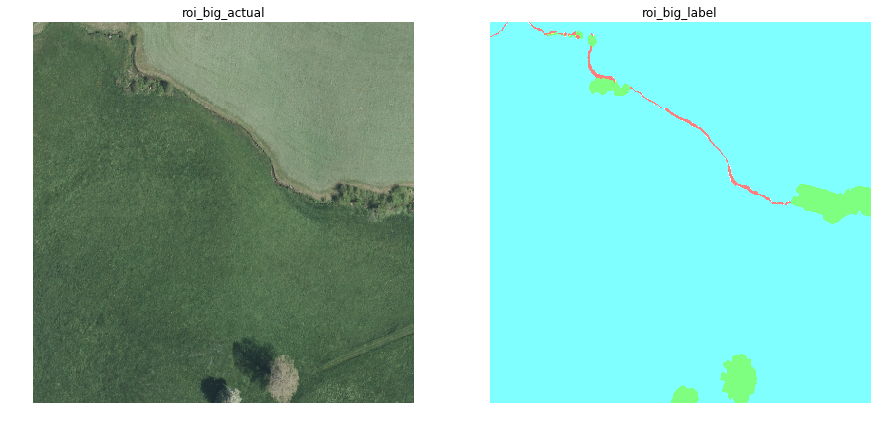

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


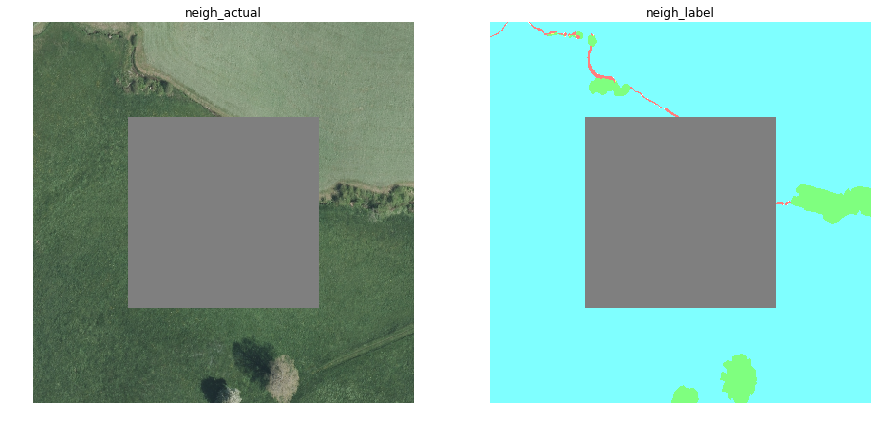

ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 0
dist b/w neigh and gen roi: 1806.0000000000007 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Unknown at 5
dist b/w neigh and gen roi: 1806.0200000000018 for class: Unknown
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


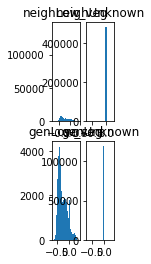

-0.71788657
0.38211492
-0.71788657
0.38211492
-1.0039216
0.38211492
-0.7850940227508545
0.38211492


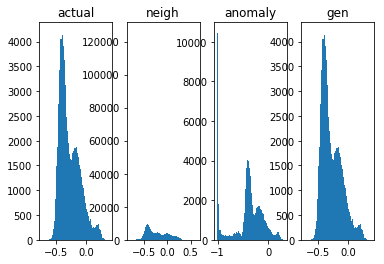

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


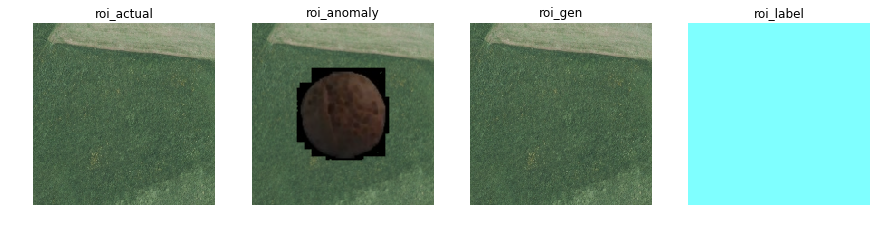

[[  0 255 255]]
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 0
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 182.245 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


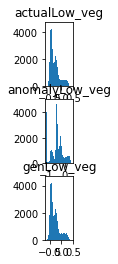

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


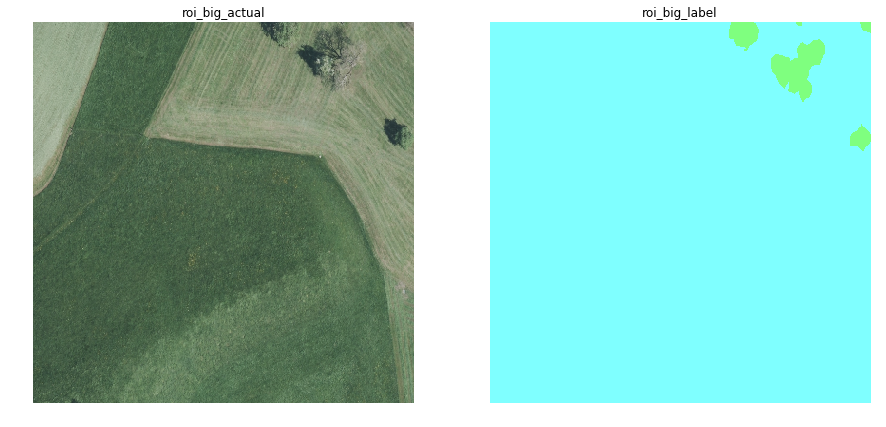

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


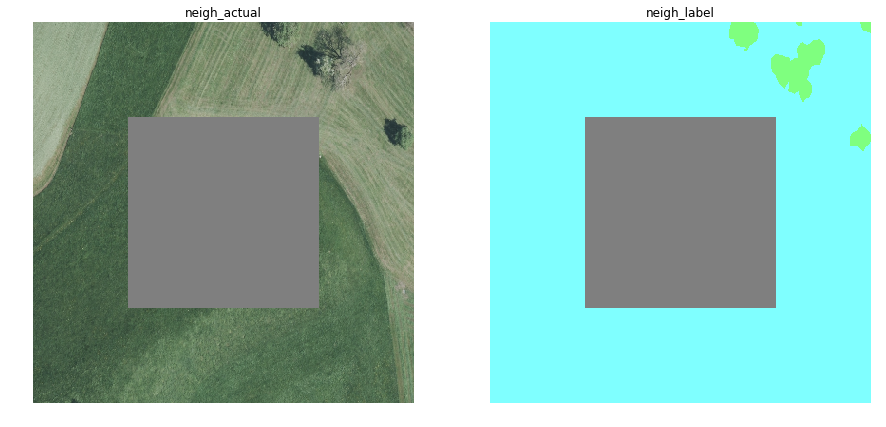

ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 0
dist b/w neigh and gen roi: 1806.0000000000002 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


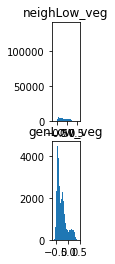

-0.64307487
0.4630094
-0.64307487
0.4630094
-1.0039216
0.4630094
-0.7280347347259521
0.4630094


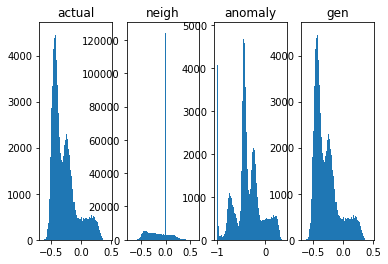

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


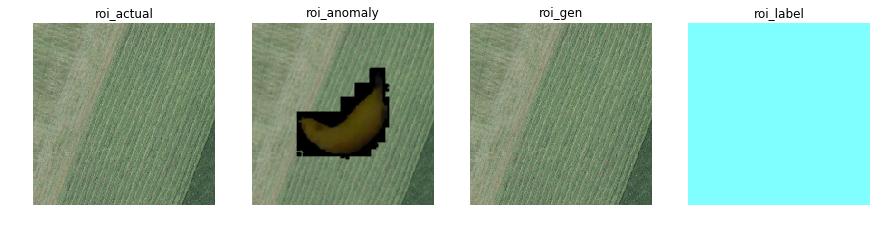

[[  0 255 255]]
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 0
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 113.92 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


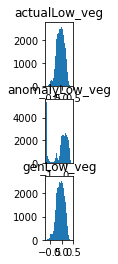

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


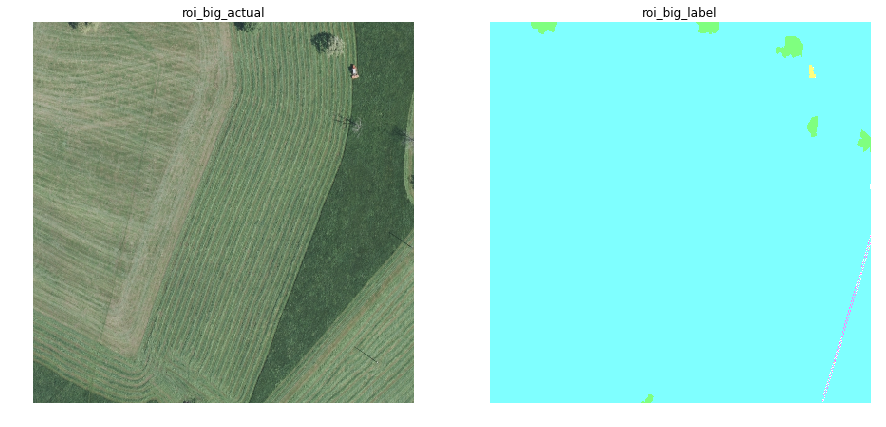

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


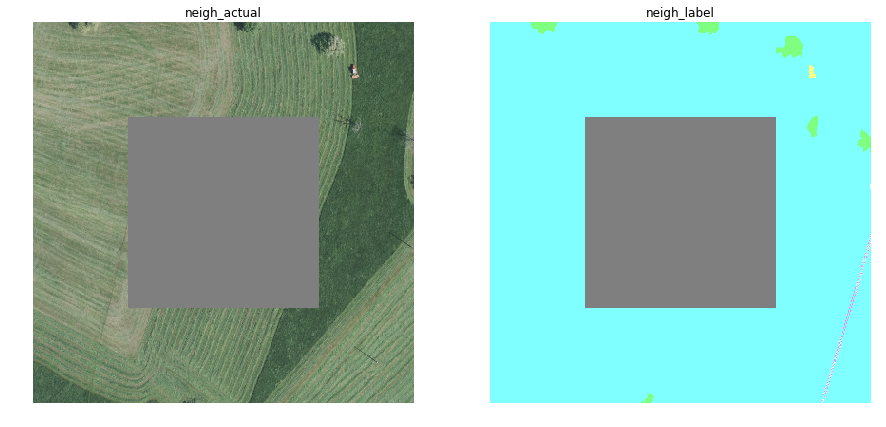

ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 0
dist b/w neigh and gen roi: 1806.0000000000007 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


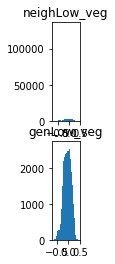

-0.6757403
0.45836985
-0.6757403
0.45836985
-1.0039216
0.45836985
-0.7240390181541443
0.45836985


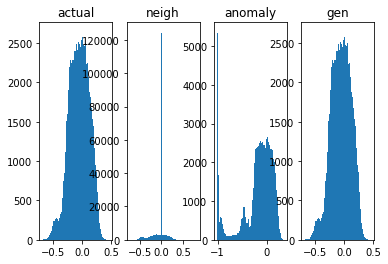

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


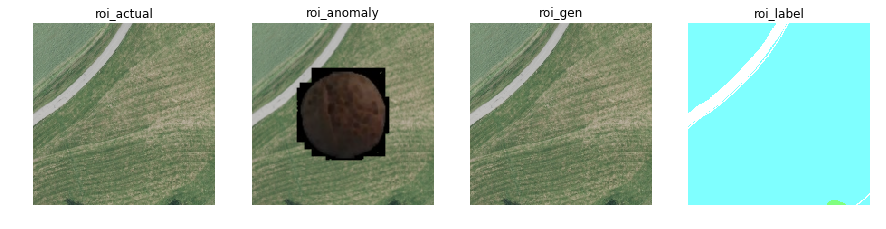

[[  0 255   0]
 [  0 255  84]
 [  0 255  85]
 [  0 255 170]
 [  0 255 255]
 [ 42 212 212]
 [ 84 169 169]
 [ 84 255 255]
 [ 85 255 255]
 [127 127 127]
 [169 169 169]
 [169 255 255]
 [170 255 255]
 [255 255 255]]
found Street at 13
current label [255, 255, 255] and class Street
dist b/w actual and gen roi: 0.0 for class: Street
dist b/w anomaly and gen roi: 4.420000000000001 for class: Street
ALiasing error in image, CHECK.
found Low_veg at 4
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 190.98 for class: Low_veg
found Trees at 0
current label [0, 255, 0] and class Trees
dist b/w actual and gen roi: 0.0 for class: Trees
dist b/w anomaly and gen roi: 0.08000000000000007 for class: Trees
ALiasing error in image, CHECK.
found Unknown at 9
current label [127, 127, 127] and class Unknown
dist b/w actual and gen roi: 0.0 for class: Unknown
dist b/w anomaly and gen roi: 0.7 for class: Unknown
ALiasing error in ima

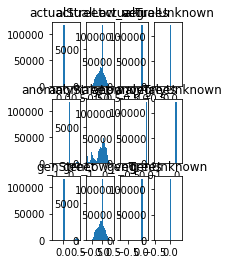

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


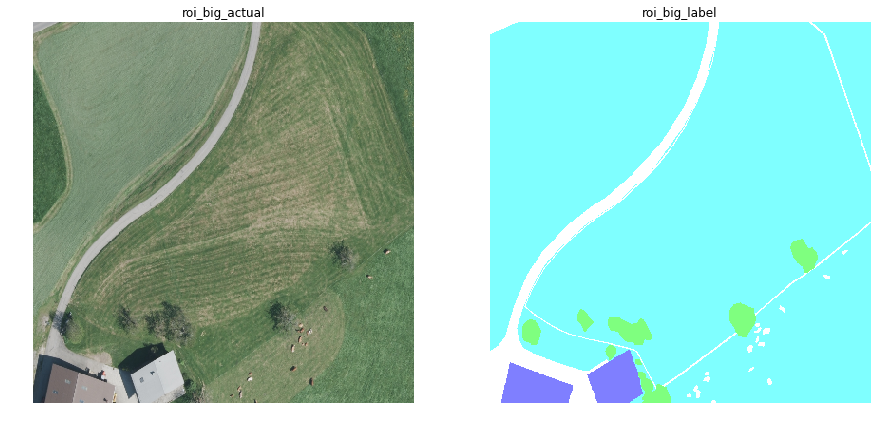

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


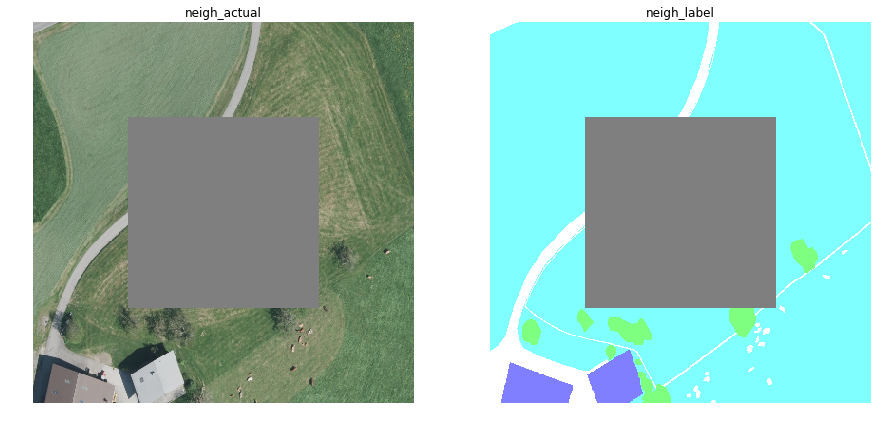

found Street at 13
dist b/w neigh and gen roi: 1806.0000000000016 for class: Street
ALiasing error in image, CHECK.
found Low_veg at 4
dist b/w neigh and gen roi: 1806.0000000000007 for class: Low_veg
found Trees at 0
dist b/w neigh and gen roi: 1806.0000000000016 for class: Trees
ALiasing error in image, CHECK.
found Unknown at 9
dist b/w neigh and gen roi: 1806.0000000000018 for class: Unknown
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


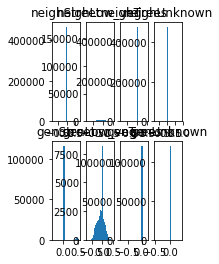

-0.7262377
0.5326914
-0.7262377
0.5326914
-1.0039216
0.5326914
-0.7922239303588867
0.5326914


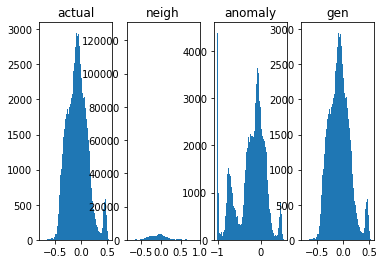

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


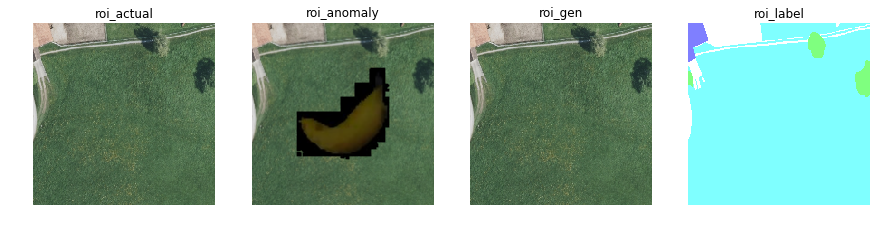

[[  0   0 255]
 [  0 170 255]
 [  0 255   0]
 [  0 255 169]
 [  0 255 170]
 [  0 255 255]
 [ 42  42 212]
 [ 42 212 212]
 [ 84  84 169]
 [ 84 169  84]
 [ 84 169 169]
 [ 84 255 255]
 [ 85  85 255]
 [ 85 255 255]
 [127 127 127]
 [169 169 169]
 [169 255 169]
 [169 255 255]
 [170 170 255]
 [170 255 170]
 [170 255 255]
 [212 212 212]
 [255 255 255]]
found Street at 22
current label [255, 255, 255] and class Street
dist b/w actual and gen roi: 0.0 for class: Street
dist b/w anomaly and gen roi: 1.7099999999999995 for class: Street
found Building at 0
current label [0, 0, 255] and class Building
dist b/w actual and gen roi: 0.0 for class: Building
dist b/w anomaly and gen roi: 0.8599999999999999 for class: Building
found Low_veg at 5
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 104.92999999999998 for class: Low_veg
found Trees at 2
current label [0, 255, 0] and class Trees
dist b/w actual and gen roi: 0.0 for cl

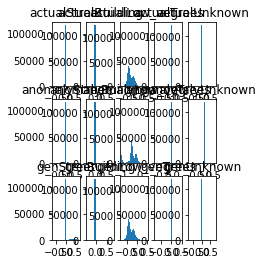

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


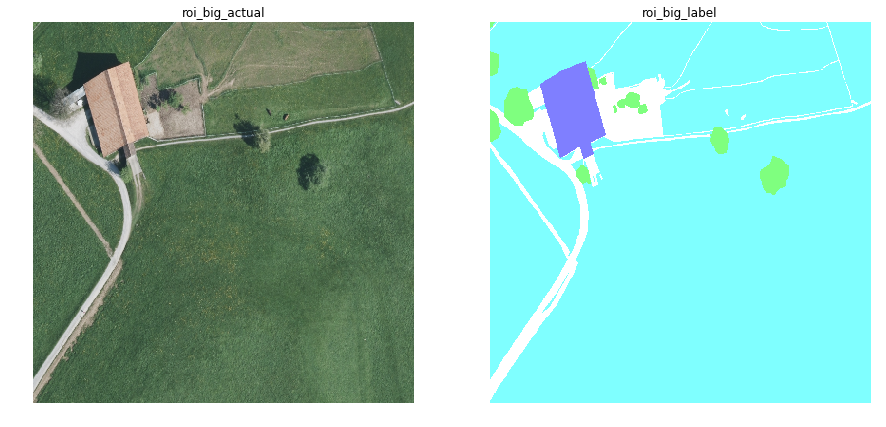

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


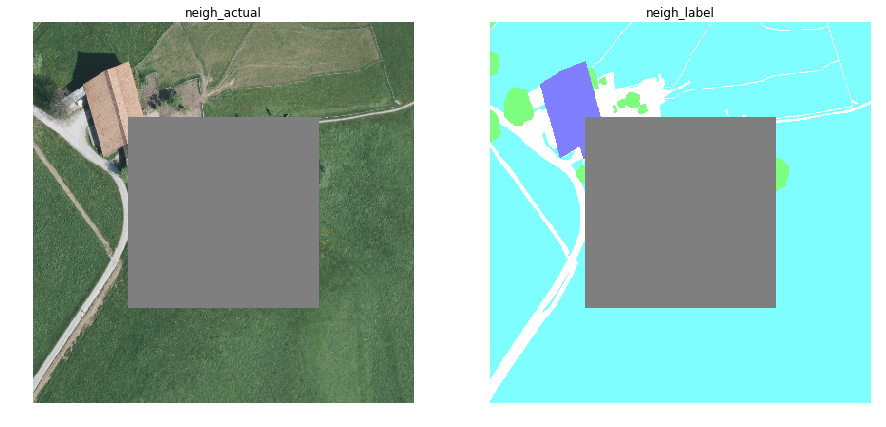

found Street at 22
dist b/w neigh and gen roi: 1806.0000000000014 for class: Street
found Building at 0
dist b/w neigh and gen roi: 1806.0000000000016 for class: Building
found Low_veg at 5
dist b/w neigh and gen roi: 1806.0000000000007 for class: Low_veg
found Trees at 2
dist b/w neigh and gen roi: 1806.0000000000016 for class: Trees
ALiasing error in image, CHECK.
found Unknown at 14
dist b/w neigh and gen roi: 1806.0000000000018 for class: Unknown
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


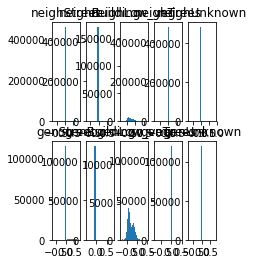

-0.78436637
0.7925638
-0.78436637
0.7925638
-1.0039216
0.7925638
-0.8029094934463501
0.7925638


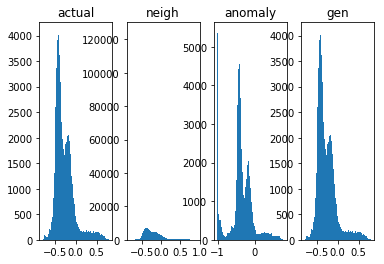

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


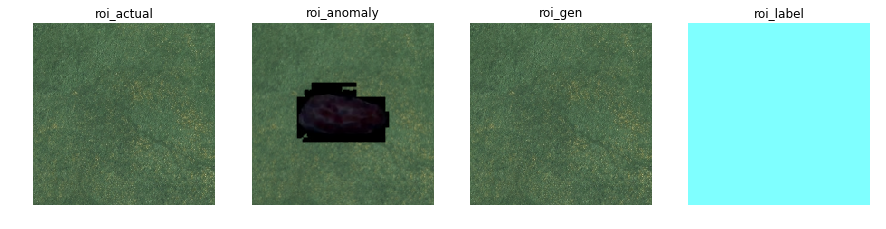

[[  0 255 255]]
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 0
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 122.38999999999996 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


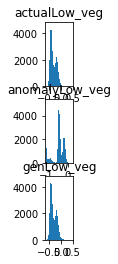

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


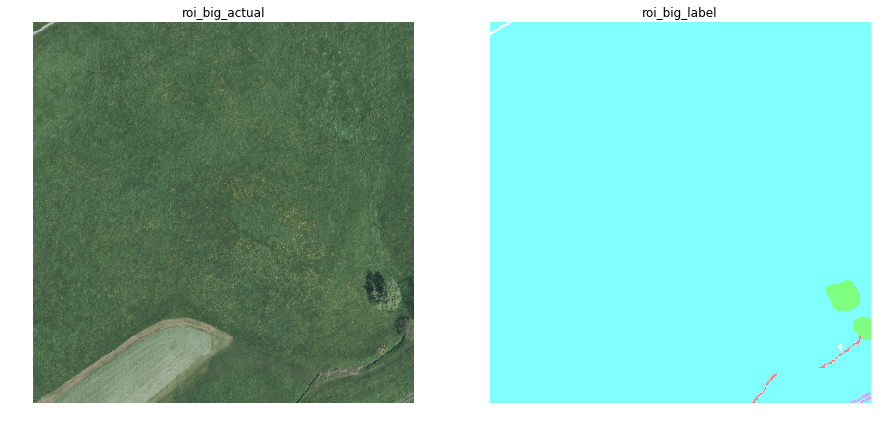

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


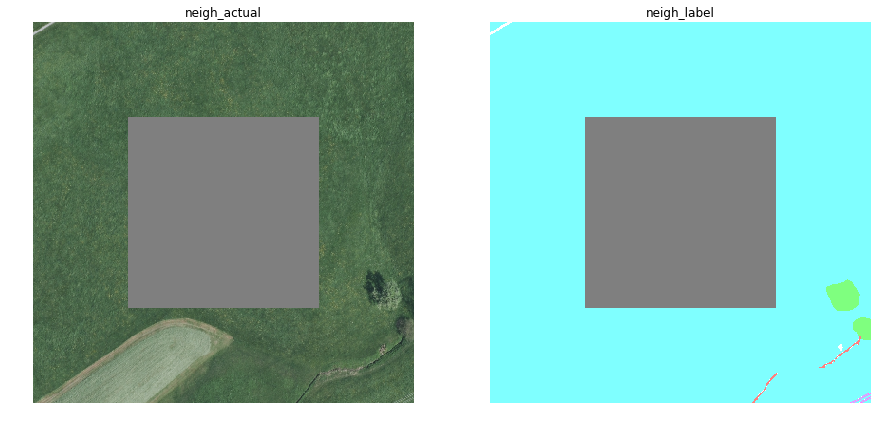

ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 0
dist b/w neigh and gen roi: 1806.0 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


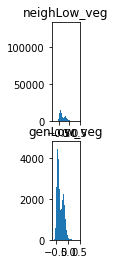

-0.6241596
0.4704575
-0.6241596
0.4704575
-1.0039216
0.4704575
-0.7746346592903137
0.4704575


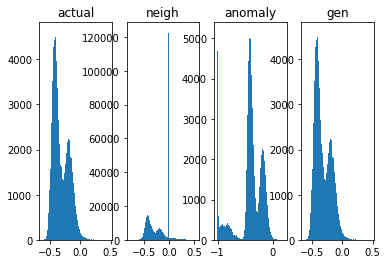

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


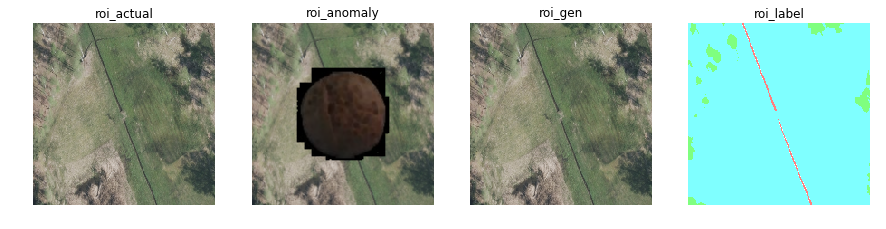

[[  0 255   0]
 [  0 255  84]
 [  0 255  85]
 [  0 255 169]
 [  0 255 170]
 [  0 255 255]
 [ 84 170 170]
 [ 85 169 169]
 [169  85  85]
 [170  84  84]
 [255   0   0]]
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 5
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 203.49 for class: Low_veg
found Trees at 0
current label [0, 255, 0] and class Trees
dist b/w actual and gen roi: 0.0 for class: Trees
dist b/w anomaly and gen roi: 1.7600000000000002 for class: Trees
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Unknown at 10
current label [255, 0, 0] and class Unknown
dist b/w actual and gen roi: 0.0 for class: Unknown
dist b/w anomaly and gen roi: 1.345 for class: Unknown
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


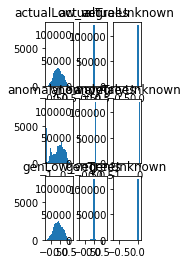

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


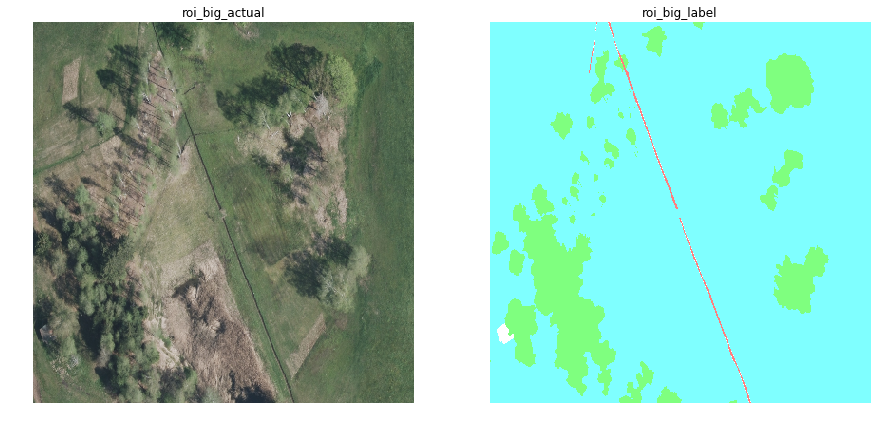

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


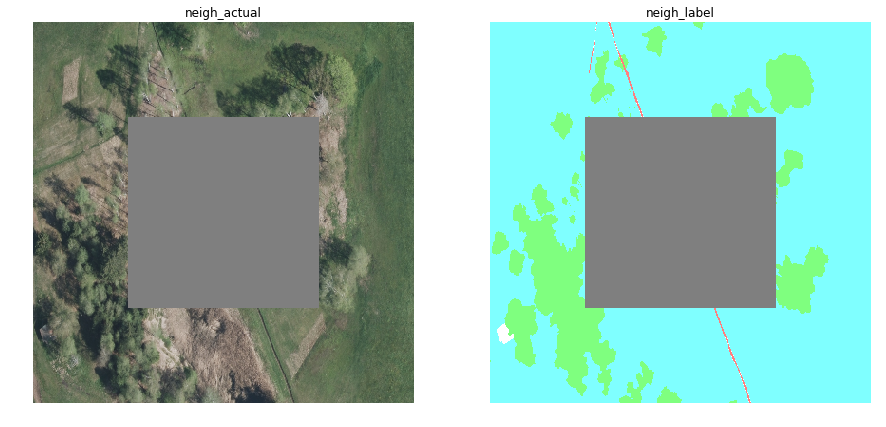

ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 5
dist b/w neigh and gen roi: 1806.0000000000007 for class: Low_veg
found Trees at 0
dist b/w neigh and gen roi: 1806.0000000000014 for class: Trees
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Unknown at 10
dist b/w neigh and gen roi: 1807.2700000000016 for class: Unknown
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


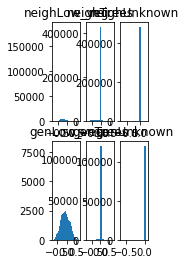

-0.74774104
0.71305746
-0.74774104
0.71305746
-1.0039216
0.71305746
-0.7880142331123352
0.71305746


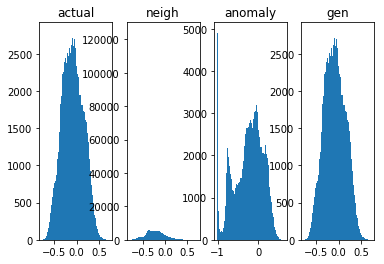

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


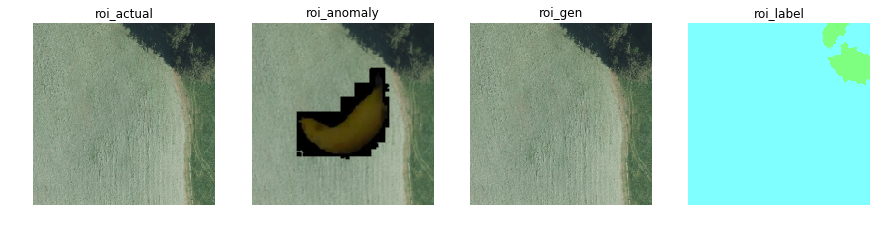

[[  0 255   0]
 [  0 255  84]
 [  0 255  85]
 [  0 255 169]
 [  0 255 170]
 [  0 255 255]]
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 5
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 120.83999999999997 for class: Low_veg
found Trees at 0
current label [0, 255, 0] and class Trees
dist b/w actual and gen roi: 0.0 for class: Trees
dist b/w anomaly and gen roi: 2.59 for class: Trees
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


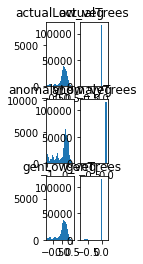

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


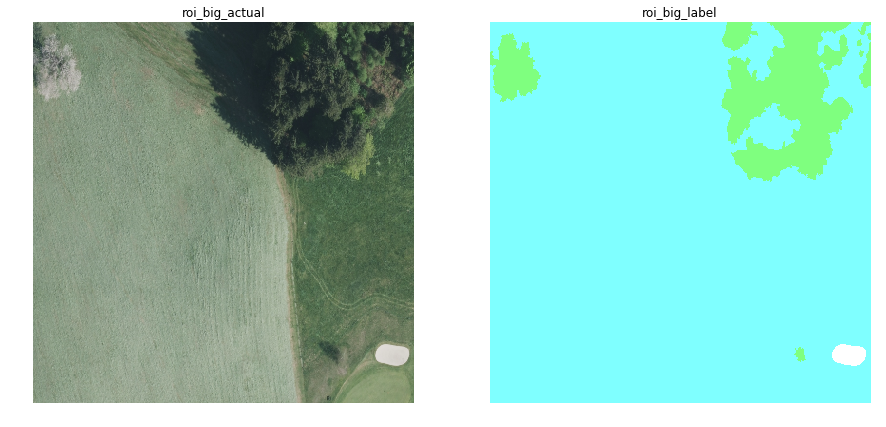

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


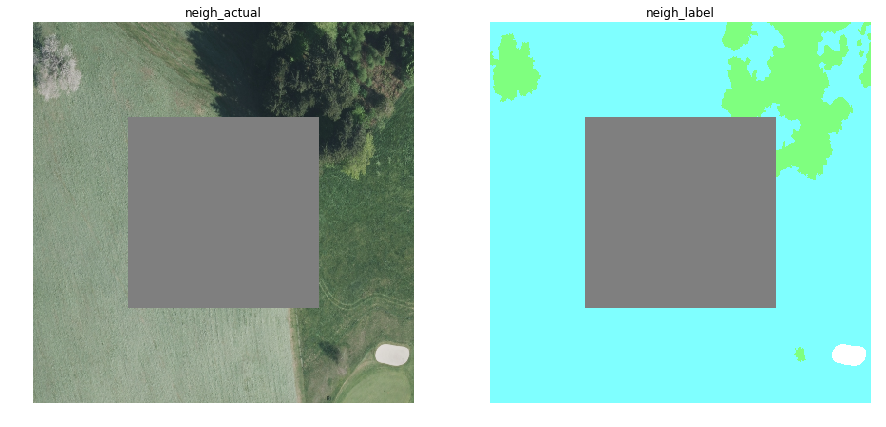

ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 5
dist b/w neigh and gen roi: 1806.000000000001 for class: Low_veg
found Trees at 0
dist b/w neigh and gen roi: 1806.0000000000014 for class: Trees
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


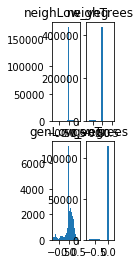

-0.79718184
0.5400451
-0.79718184
0.5400451
-1.0039216
0.5400451
-0.8117647171020508
0.5400451


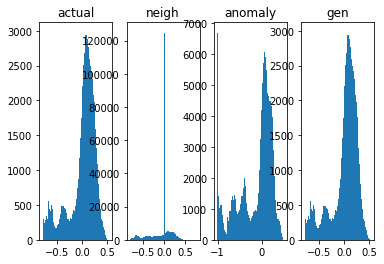

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


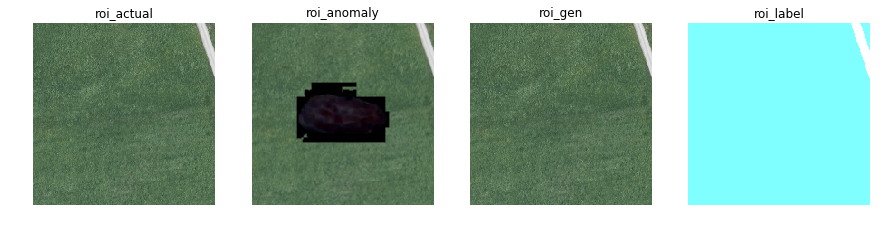

[[  0 255 255]
 [ 85 255 255]
 [255 255 255]]
found Street at 2
current label [255, 255, 255] and class Street
dist b/w actual and gen roi: 0.0 for class: Street
dist b/w anomaly and gen roi: 1.0699999999999998 for class: Street
ALiasing error in image, CHECK.
found Low_veg at 0
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 134.68499999999995 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


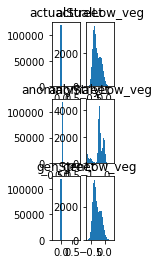

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


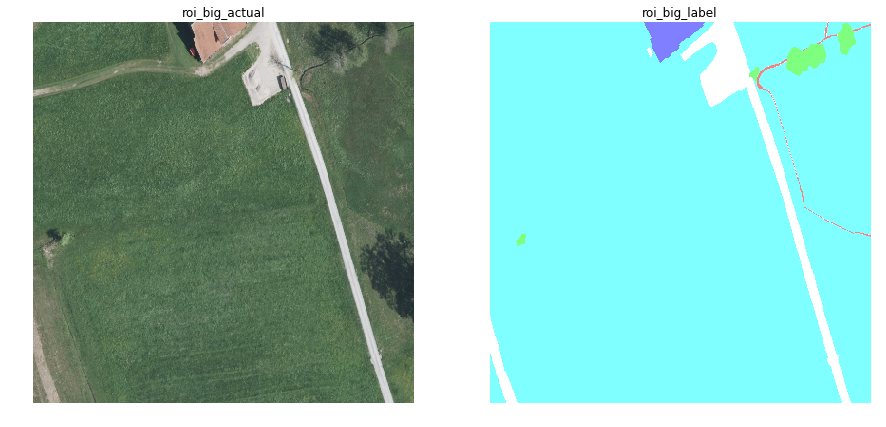

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


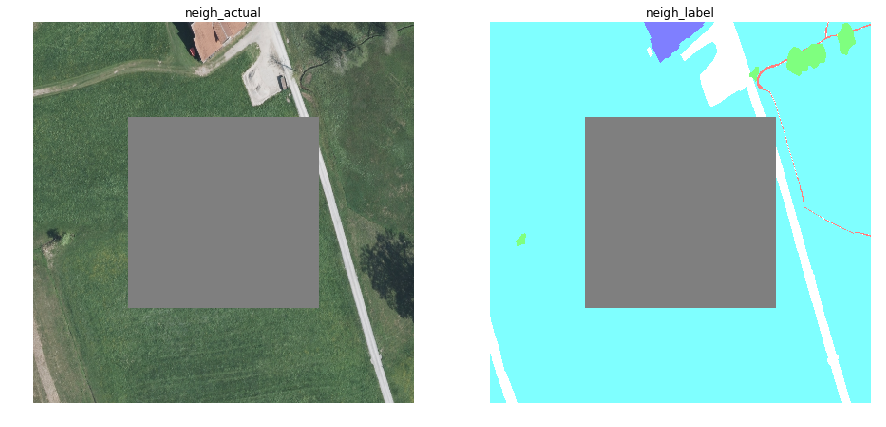

found Street at 2
dist b/w neigh and gen roi: 1806.0000000000016 for class: Street
ALiasing error in image, CHECK.
found Low_veg at 0
dist b/w neigh and gen roi: 1806.0000000000005 for class: Low_veg
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


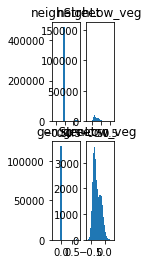

-0.6201505
0.811281
-0.6201505
0.811281
-1.0039216
0.811281
-0.7881088852882385
0.811281


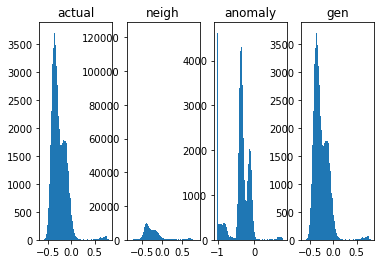

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


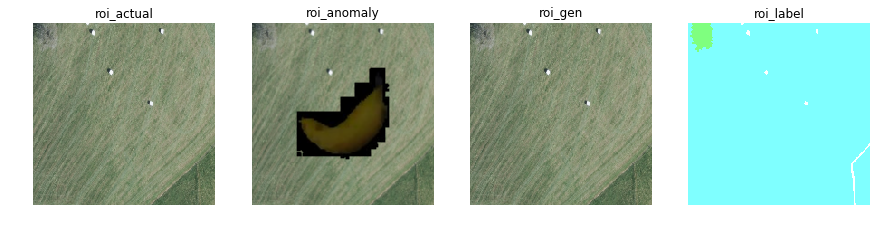

[[  0 255   0]
 [  0 255  84]
 [  0 255  85]
 [  0 255 255]
 [ 42 212 212]
 [ 84 169 169]
 [127 127 127]]
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 3
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 130.86500000000004 for class: Low_veg
found Trees at 0
current label [0, 255, 0] and class Trees
dist b/w actual and gen roi: 0.0 for class: Trees
dist b/w anomaly and gen roi: 0.9900000000000001 for class: Trees
ALiasing error in image, CHECK.
found Unknown at 6
current label [127, 127, 127] and class Unknown
dist b/w actual and gen roi: 0.0 for class: Unknown
dist b/w anomaly and gen roi: 0.5899999999999999 for class: Unknown
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


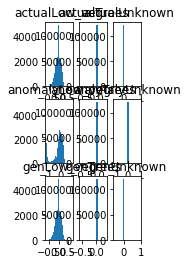

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


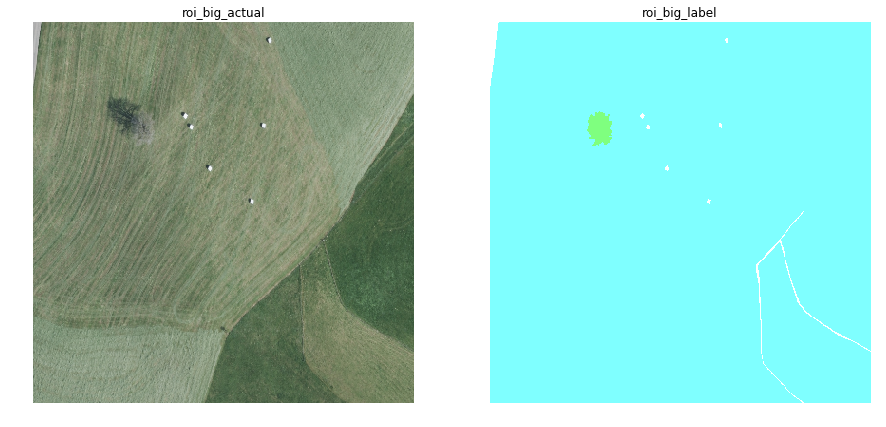

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


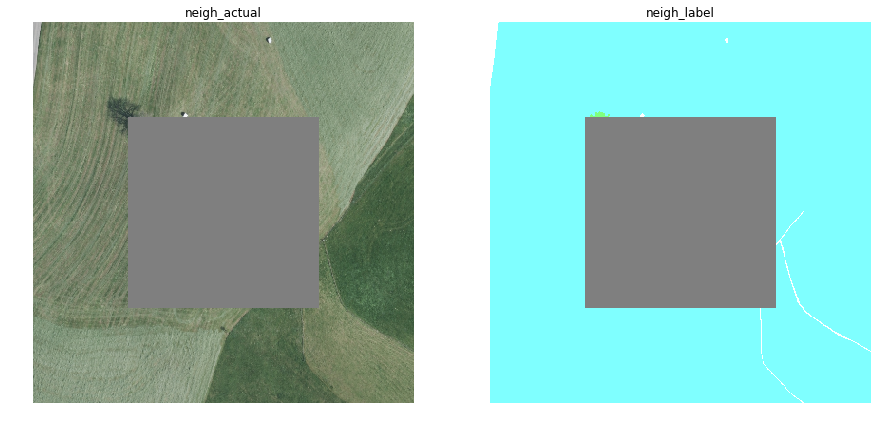

ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 3
dist b/w neigh and gen roi: 1806.0500000000006 for class: Low_veg
found Trees at 0
dist b/w neigh and gen roi: 1822.1900000000016 for class: Trees
ALiasing error in image, CHECK.
found Unknown at 6
dist b/w neigh and gen roi: 1806.0000000000016 for class: Unknown
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


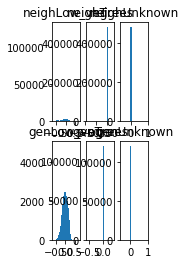

-0.66227806
0.94509804
-0.66227806
0.94509804
-1.0039216
0.94509804
-0.6746364831924438
0.94509804


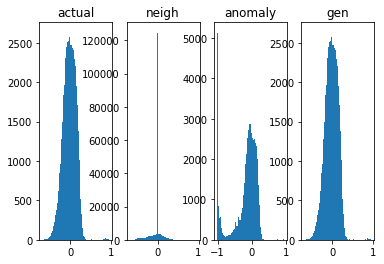

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


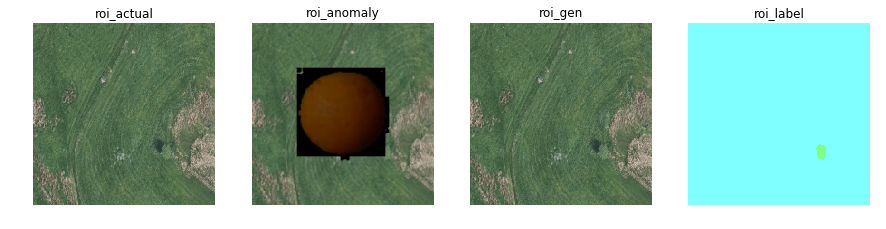

[[  0 255   0]
 [  0 255 255]]
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 1
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 135.42499999999998 for class: Low_veg
found Trees at 0
current label [0, 255, 0] and class Trees
dist b/w actual and gen roi: 0.0 for class: Trees
dist b/w anomaly and gen roi: 1.0450000000000002 for class: Trees
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


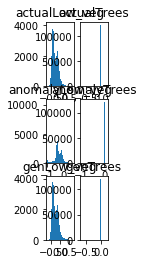

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


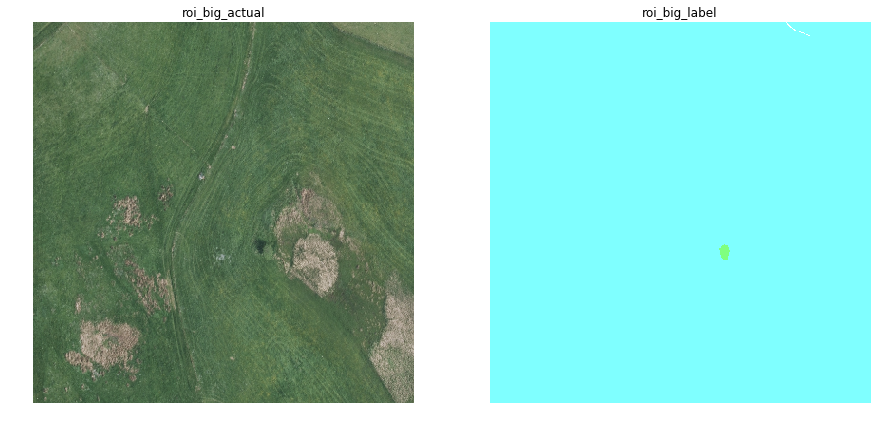

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


roi_actual_np shape: (1, 201, 201, 3)
roi_label_np shape: (1, 201, 201, 3)
np_neigh_mask shape: (1, 401, 401, 3)


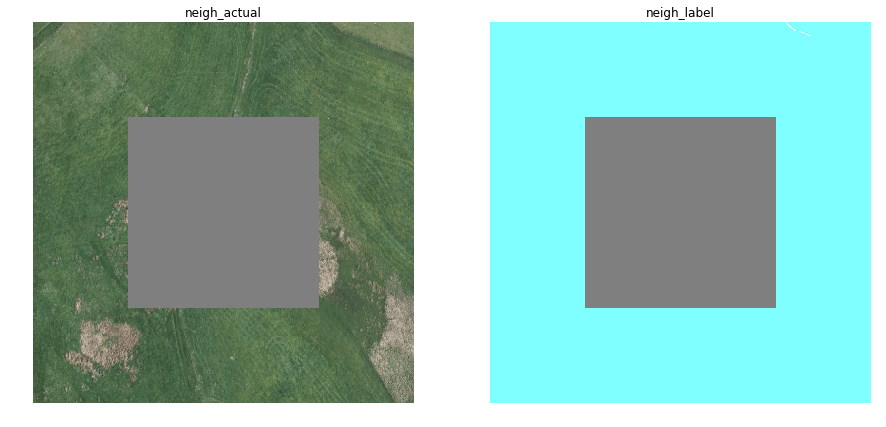

ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
found Low_veg at 1
dist b/w neigh and gen roi: 1806.1300000000008 for class: Low_veg
found Trees at 0
dist b/w neigh and gen roi: 1810.0000000000016 for class: Trees
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.
ALiasing error in image, CHECK.


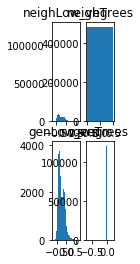

-0.7089358
0.6759973
-0.7089358
0.6759973
-1.0039216
0.6759973
-0.6436491012573242
0.6759973


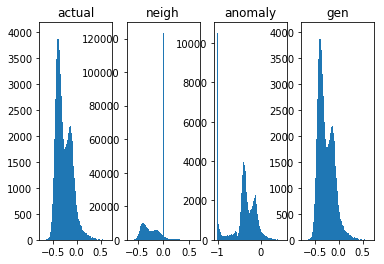

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


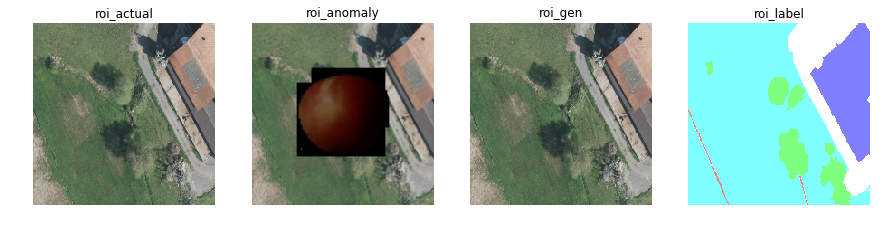

[[  0   0 255]
 [  0 255   0]
 [  0 255  84]
 [  0 255  85]
 [  0 255 169]
 [  0 255 170]
 [  0 255 255]
 [ 42  42 212]
 [ 84  84 169]
 [ 84  84 255]
 [ 84 170 170]
 [ 84 255 255]
 [ 85 169 169]
 [ 85 255  85]
 [ 85 255 255]
 [127 127 127]
 [169  85   0]
 [169  85  85]
 [169 169 169]
 [169 169 255]
 [170  84  84]
 [170 255 255]
 [212 212 212]
 [255   0   0]
 [255 255 255]]
found Street at 24
current label [255, 255, 255] and class Street
dist b/w actual and gen roi: 0.0 for class: Street
dist b/w anomaly and gen roi: 10.110000000000001 for class: Street
found Building at 0
current label [0, 0, 255] and class Building
dist b/w actual and gen roi: 0.0 for class: Building
dist b/w anomaly and gen roi: 6.675000000000001 for class: Building
found Low_veg at 6
current label [0, 255, 255] and class Low_veg
dist b/w actual and gen roi: 0.0 for class: Low_veg
dist b/w anomaly and gen roi: 80.97 for class: Low_veg
found Trees at 1
current label [0, 255, 0] and class Trees
dist b/w actual and gen

KeyboardInterrupt: 

In [35]:
#for img, mask in anomaly_dataset:
#    display_images(img, mask)
with open('generator_general_check.csv', mode='w') as ggc_file:
    ggc_writer = csv.writer(ggc_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
with open('generator_consistency_check.csv', mode='w') as gcc_file:
    gcc_writer = csv.writer(gcc_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
with open('generator_anomaly_check.csv', mode='w') as gac_file:
    gac_writer = csv.writer(gac_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)

for label, imagery in train_dataset:
    #display_images(imagery, label)
    img, mask = anomaly_injection(imagery)
    #anomaly_test(imagery, img)
    imagery=tf.cast(imagery, tf.float32)
    imagery = (imagery / 127.5) - 1        
    anomaly_test_boundary(imagery, img, imagery, label)
    #display_images_f(img, mask)

In [41]:
label2class[(0, 255, 255)]

'Low_veg'